# AAI-500 Final Team Project - Group 7
#### Members:
#### Suman Senapati
#### Ananya Chandraker
#### Krishnasamy Sethuraman

# Introduction

We have chosen to work on AIDS VIRUS Infection prediction dataset which encapsulates a broad spectrum of clinical and demographical variables related to AIDS patients.

#### Title of the Project: Statistical Analysis and Predictive Modeling for AIDS Virus Infection

####  Short Description of the Project:
   This project performs a Statistical Analysis and Predictive Modeling for AIDS Virus Infection

####  Objectives of the Project:
1) To develop a predictive model for AIDS virus Infection using the clinical data.
2) We aim to identify the key risk factors associated with the HIV infection and asses their impact
   through probability and statistical analysis.
3) We aim to perform Descriptive statistics like calculation of mean, median, mode, variance and
   standard deviation for numerical variables to gain insights into the central tendency and dispersion
   of numerical variables such as age and on clinical data to understand characteristics of population.
4) We aim to perform Inferential statistics like perform Hypothesis testing and chi-squared tests
   to compare means between different groups (for example: infected vs non-infected patients)
   and derive conclusions about the broader population based on the sample data
5) We aim to perform Predictive modeling to establish the relationship between predictors
   like (clinical results) and the viral infection using logistic regression analysis, correlation analysis.
   This would predict the likelihood of HIV infection based on various predictors
   
####  Details of Dataset:  

   This is a AIDS classification dataset which encapsulates a broad spectrum of clinical and
   Demographical variables related to AIDS patients.
   
   Data Source: - OpenML- AIDS_Virus_Infection_Prediction (https://www.openml.org/search?type=data&status=active&id=46076&sort=runs)
   
   Number of Variables: 23
   
   Number of Instances: 50000
   
   Size of dataset: 5.35 MB


### Importing Libraries


In [463]:
import pandas as pd
import numpy as np
from sklearn.datasets import fetch_openml
import plotly.express as px
import warnings
import seaborn as sn
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegressionCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LinearRegression

In [464]:
warnings.filterwarnings("ignore")

## Importing Dataset from OpenML


In [466]:
#AIDS classification dataset
data = fetch_openml(data_id=46076, as_frame=True)
df = data.frame # Our original dataset stored in a dataframe 'df'

### Metadata



1. time: Time since the baseline measurement, in days.

2. trt: Treatment code (0, 1, 2), where each number signifies a different treatment regimen.

3. age: Age of the patient in years.

4. wtkg: Weight of the patient in kilograms.

5. hemo: Presence of Hemophilia (0 = No, 1 = Yes).

6. homo: Homosexual behavior (0 = No, 1 = Yes).

7. drugs: Drug use (0 = No, 1 = Yes).

8. karnof: Karnofsky score indicating patient's functional impairment (scores range from 0 to 100).

9. oprior: Number of opportunistic infections prior to study.

10. z30: Presence of Z30 gene (0 = No, 1 = Yes).

11. preanti: Months before receiving antiretroviral therapy.

12. race: Race (0 = Non-white, 1 = White).

13. gender: Gender (0 = Female, 1 = Male).

14. str2: Stratification variable 2.

15. strat: Overall stratification.

16. symptom: Presence of specific AIDS-related symptoms (0 = No, 1 = Yes).

17. treat: Treatment response (0 = No, 1 = Yes).

18. offtrt: Off treatment (0 = No, 1 = Yes).

19. cd40: CD4 count at the baseline.

20. cd420: CD4 count at 20 weeks.

21. cd80: CD4 count at 8 weeks.

22. cd820: CD4 count at 20 weeks post the 8-week measurement.

23. infected: HIV infection status (0 = Negative, 1 = Positive).

## Data Preparation

### Sample Data

In [470]:
df.head(5)

,time,trt,age,wtkg,hemo,homo,drugs,karnof,oprior,z30,...,str2,strat,symptom,treat,offtrt,cd40,cd420,cd80,cd820,infected
0,1073,1,37,79.46339,0,1,0,100,0,1,...,1,2,0,1,0,322,469,882,754,1
1,324,0,33,73.02314,0,1,0,90,0,1,...,1,3,1,1,1,168,575,1035,1525,1
2,495,1,43,69.47793,0,1,0,100,0,1,...,1,1,0,0,0,377,333,1147,1088,1
3,1201,3,42,89.15934,0,1,0,100,1,1,...,1,3,0,0,0,238,324,775,1019,1
4,934,0,37,137.46581,0,1,0,100,0,0,...,0,3,0,0,1,500,443,1601,849,0


### Shape of dataset

In [472]:
df.shape

(50000, 23)

### Descriptive Statistics

In [474]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
time,50000.0,877.369780,307.288688,66.00000,542.000000,1045.000000,1136.000000,1231.00000
trt,50000.0,1.384800,1.233272,0.00000,0.000000,1.000000,3.000000,3.00000
age,50000.0,34.164020,7.091152,12.00000,29.000000,34.000000,39.000000,68.00000
wtkg,50000.0,75.861991,12.028730,42.36162,68.253682,74.054115,81.142185,149.83087
hemo,50000.0,0.033480,0.179888,0.00000,0.000000,0.000000,0.000000,1.00000
homo,50000.0,0.653540,0.475847,0.00000,0.000000,1.000000,1.000000,1.00000
drugs,50000.0,0.132220,0.338733,0.00000,0.000000,0.000000,0.000000,1.00000
karnof,50000.0,96.831560,5.091788,76.00000,90.000000,100.000000,100.000000,100.00000
oprior,50000.0,0.042300,0.201275,0.00000,0.000000,0.000000,0.000000,1.00000
z30,50000.0,0.640880,0.479747,0.00000,0.000000,1.000000,1.000000,1.00000


### Overview of Descriptive Statistics

This dataset consists of **50,000 observations** across various variables related to a study, likely in a medical or clinical research context. Below is a summary of each variable included in the dataset:

1. **Time (time)**:
   - **Mean**: 877.37
   - **Standard Deviation**: 307.29
   - **Range**: 66 to 1231

2. **Treatment (trt)**:
   - **Mean**: 1.38
   - **Standard Deviation**: 1.23
   - **Range**: 0 to 3
     
3. **Age (age)**:
   - **Mean**: 34.16 years
   - **Standard Deviation**: 7.09
   - **Range**: 12 to 68 years
   
4. **Weight (wtkg)**:
   - **Mean**: 75.86 kg
   - **Standard Deviation**: 12.03
   - **Range**: 42.36 to 149.83 kg
   
5. **Hemoglobin Level (hemo)**:
   - **Mean**: 0.03
   - **Standard Deviation**: 0.18
   - **Range**: 0 to 1
   
6. **Homozygous (homo)**:
   - **Mean**: 0.65
   - **Standard Deviation**: 0.48
   - **Range**: 0 to 1
   
7. **Drugs (drugs)**:
   - **Mean**: 0.13
   - **Standard Deviation**: 0.34
   - **Range**: 0 to 1
   
8. **Karnofsky Performance Status (karnof)**:
   - **Mean**: 96.83
   - **Standard Deviation**: 5.09
   - **Range**: 76 to 100
       

### Conclusion

This dataset provides comprehensive information about a cohort of participants in a clinical or medical study, including demographic details, treatment information, clinical measurements, and health status indicators. The large sample size allows for robust statistical analysis and insights into the relationships between these variables and their impact on health outcomes.

We shall try to establish a potential relationship between the target variable (infected) and the features of the model

In [476]:
df.dtypes

time          int64
trt           int64
age           int64
wtkg        float64
hemo          int64
homo          int64
drugs         int64
karnof        int64
oprior        int64
z30           int64
preanti       int64
race          int64
gender        int64
str2          int64
strat         int64
symptom       int64
treat         int64
offtrt        int64
cd40          int64
cd420         int64
cd80          int64
cd820         int64
infected      int64
dtype: object

In [477]:
df['infected'].unique()

array([1, 0], dtype=int64)

## Data Cleaning

### Missing values

In [480]:
df.isna().sum().sum()

0

### Outlier detection and removal

#### Outlier Detection

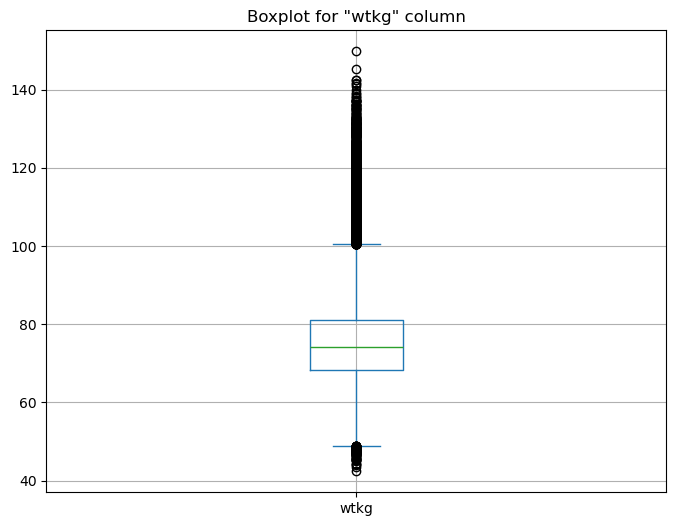

In [483]:
plt.figure(figsize=(8, 6))
df['wtkg'].plot(kind='box')
plt.title('Boxplot for "wtkg" column')
plt.grid()
plt.show()

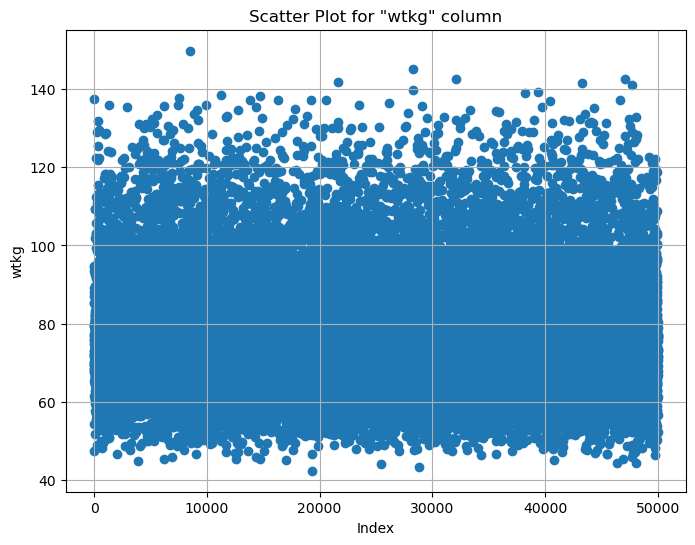

In [484]:
plt.figure(figsize=(8, 6))
plt.scatter(x=range(len(df)), y=df['wtkg'])
plt.xlabel('Index')
plt.ylabel('wtkg')
plt.title('Scatter Plot for "wtkg" column')
plt.grid()
plt.show()

#### Using Z-Score

In [486]:
x = 'wtkg'
threshold = 3  # Z-score threshold for outliers

mean_x = df[x].mean()
std_x = df[x].std()

df['z_score'] = (df[x] - mean_x) / std_x
print(df['z_score'])

# Boolean mask for outliers based on Z-score threshold
outliers = (df['z_score'].abs() > threshold)

# Print the number of outliers found
print(f"Outliers found: {outliers.sum()}")

# Remove outliers from the original DataFrame
df_cleaned = df[~outliers]  # Negate to keep only non-outliers

# Check the cleaned DataFrame's shape
print(f"Cleaned dataset shape: {df_cleaned.shape}")

# Drop the 'z_score' column as it's no longer needed
df_cleaned = df_cleaned.drop(columns=['z_score'])

0        0.299400
1       -0.236006
2       -0.530734
3        1.105466
4        5.121390
           ...   
49995   -1.212094
49996   -0.207363
49997    0.240778
49998   -1.966815
49999    0.104667
Name: z_score, Length: 50000, dtype: float64
Outliers found: 846
Cleaned dataset shape: (49154, 24)


In [487]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
time,50000.0,8.773698e+02,307.288688,66.00000,542.000000,1045.000000,1136.000000,1231.000000
trt,50000.0,1.384800e+00,1.233272,0.00000,0.000000,1.000000,3.000000,3.000000
age,50000.0,3.416402e+01,7.091152,12.00000,29.000000,34.000000,39.000000,68.000000
wtkg,50000.0,7.586199e+01,12.028730,42.36162,68.253682,74.054115,81.142185,149.830870
hemo,50000.0,3.348000e-02,0.179888,0.00000,0.000000,0.000000,0.000000,1.000000
homo,50000.0,6.535400e-01,0.475847,0.00000,0.000000,1.000000,1.000000,1.000000
drugs,50000.0,1.322200e-01,0.338733,0.00000,0.000000,0.000000,0.000000,1.000000
karnof,50000.0,9.683156e+01,5.091788,76.00000,90.000000,100.000000,100.000000,100.000000
oprior,50000.0,4.230000e-02,0.201275,0.00000,0.000000,0.000000,0.000000,1.000000
z30,50000.0,6.408800e-01,0.479747,0.00000,0.000000,1.000000,1.000000,1.000000


Here's what we know about the dataset:
1. No missing/NaN values
2. The dataset has 50k rows and 23 columns
3. The dataset has no categorical variables. But, some of these numerical variables may be discrete. Needs further analysis to figure that out.


Our target variable is infected which has two unique values, as describes in the attrib description

## Exploratory Data Analysis

### Univariate Analysis

Distribution of the target variable

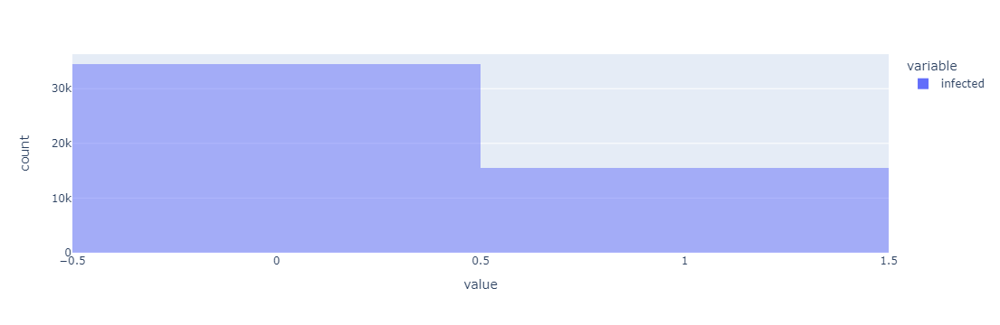

In [492]:
fig = px.histogram(df['infected'],barmode='overlay',nbins=2)
fig.show()

#### Number of Unique values in every column of the dataset


In [494]:
df.nunique()

time         1094
trt             4
age            57
wtkg        49623
hemo            2
homo            2
drugs           2
karnof         13
oprior          2
z30             2
preanti      1775
race            2
gender          2
str2            2
strat           3
symptom         2
treat           2
offtrt          2
cd40          639
cd420         902
cd80         2710
cd820        2020
infected        2
z_score     49623
dtype: int64

#### Segregation of columns based on discrete and continuous variables


In [496]:
for x in df.columns:
    if df[x].dtype == 'int64':
        print(f'{x} : discrete')
    elif df[x].dtype == 'float64':
        if all(x.is_integer() for x in df[x].dropna()):
            print(f'{x} : discrete')
        else:
            print(f'{x} : continuous')

time : discrete
trt : discrete
age : discrete
wtkg : continuous
hemo : discrete
homo : discrete
drugs : discrete
karnof : discrete
oprior : discrete
z30 : discrete
preanti : discrete
race : discrete
gender : discrete
str2 : discrete
strat : discrete
symptom : discrete
treat : discrete
offtrt : discrete
cd40 : discrete
cd420 : discrete
cd80 : discrete
cd820 : discrete
infected : discrete
z_score : continuous


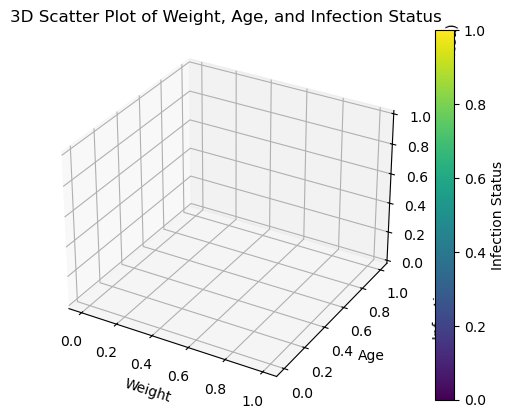

In [497]:
# Assuming 'weight', 'age', and 'infected' are the relevant columns
# Replace these with actual column names from your dataset
weight = df['wtkg']   # Replacing with actual column name
age = df['age']         # Replacing with actual column name
infected = df['infected']  # Replacing with actual column name

# Converting infection status to numeric if it's categorical (e.g., 0 for not infected, 1 for infected)
infected_numeric = infected.map({'not_infected': 0, 'infected': 1})  # Adjust based on your data


# Create a new figure for the 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(weight, age, infected_numeric, c=infected_numeric, cmap='viridis', marker='o')

# Labels and title
ax.set_xlabel('Weight')
ax.set_ylabel('Age')
ax.set_zlabel('Infection Status (0=Not Infected, 1=Infected)')
ax.set_title('3D Scatter Plot of Weight, Age, and Infection Status')

# Add color bar for better interpretation
cbar = plt.colorbar(scatter)
cbar.set_label('Infection Status')

# Show the plot
plt.show()


# Convert infection status to numeric for better visualization
df['infected_numeric'] = df['infected'].map({'not_infected': 0, 'infected': 1})

# Create a 3D scatter plot for Age vs Weight vs Infection Status
fig = px.scatter_3d(df, x='age', y='wtkg', z='infected_numeric',
                    title='3D Scatter Plot of Age, Weight, and Infection Status',
                    labels={'age': 'Age (years)',
                            'wtkg': 'Weight (kg)',
                            'infected_numeric': 'Infection Status (0=Not Infected, 1=Infected)'},
                    color='infected',  # Color points based on infection status
                    color_discrete_sequence=['blue', 'red'])  # Custom colors

# Show the plot
fig.show()

## Draw Histograms to provides insights into how ages are distributed across the dataset and provides insight to see patterns such as skewness, modality (unimodal, bimodal), and outliers.

## The scatter plot shows individual data points for weight and age, which can help identify trends, clusters, or outliers in weight and age.The provided code snippet utilizes Plotly Express to create visualizations of a dataset stored in a DataFrame.

1. **Histogram of Age Distribution**: A histogram is generated to visualize the distribution of ages within the dataset. The age variable is plotted on the x-axis, and the title of the histogram is set to "Age Distribution."

2. **Scatter Plot of Age vs. Weight**: A scatter plot is created to illustrate the relationship between age and weight. The age variable is plotted on the x-axis, while weight is plotted on the y-axis. The axis labels are customized for clarity, indicating "Age (years)" and "Weight (kg)."

3. **Displaying the Scatter Plot**: The scatter plot is displayed to provide insights into how age relates to weight among participants in the dataset.

Overall, these visualizations facilitate exploratory data analysis and enhance understanding of participant characteristics, particularly regarding age distribution and the relationship between age and weight.

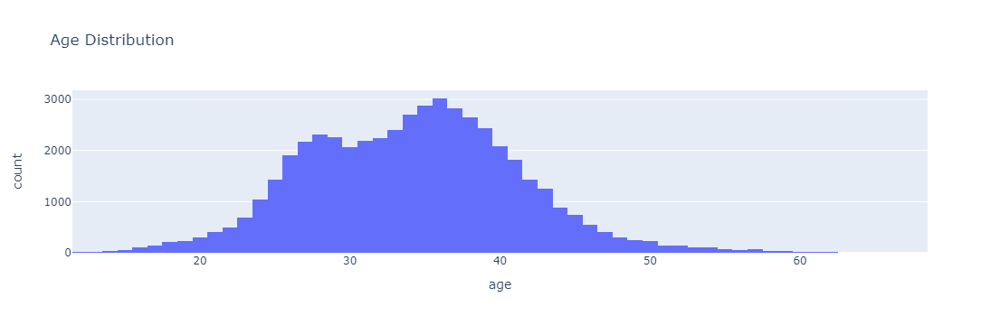

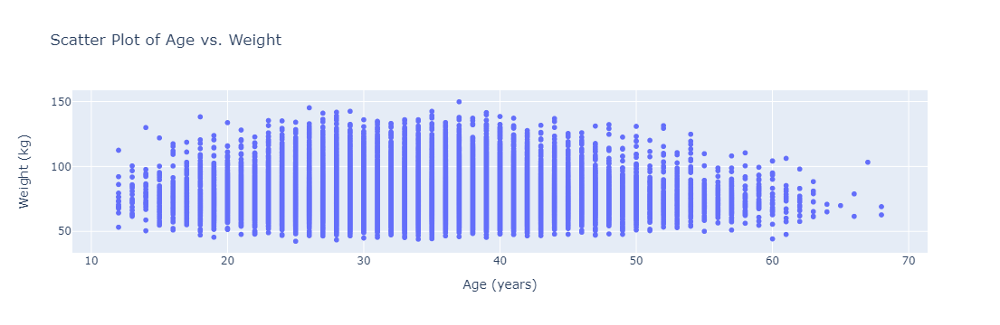

In [499]:
fig = px.histogram(df, x='age', title='Age Distribution')
fig.show()

#fig = px.scatter(df, y='wtkg', title='Weight Distribution')
#fig.show()

# Create a scatter plot for Age vs. Weight
fig = px.scatter(df, x='age', y='wtkg', title='Scatter Plot of Age vs. Weight',
                 labels={'age': 'Age (years)', 'wtkg': 'Weight (kg)'})

# Show the plot
fig.show()


## Bar plot is created to visualize the Gender distribution and Drug use Distribution.
### Bar Plot Description


1. **Gender Distribution Bar Plot**:
   - This bar plot displays the distribution of gender within the dataset.
   - The `value_counts()` method is used to count the occurrences of each gender category, resulting in a frequency distribution.
   - Each bar represents a different gender category, with the height of the bar indicating the number of occurrences for that category.
   - The title "Gender Distribution" clearly indicates what the plot represents, allowing viewers to quickly understand the focus of the visualization.

2. **Drug Use Distribution Bar Plot**:
   - This bar plot visualizes the distribution of drug use among participants in the dataset.
   - Similar to the first plot, `value_counts()` is applied to count how many participants fall into each category of drug use.
   - Each bar represents a specific category related to drug use (e.g., users vs. non-users), with the height reflecting the frequency of participants in each category.
   - The title "Drug Use Distribution" provides immediate context for interpreting the data presented in the plot.

### Summary

Both bar plots effectively communicate categorical information by showing frequencies for each category. They allow for easy comparison between different groups (genders and drug use categories) and help identify trends or patterns within the dataset. The visual nature of bar plots makes it straightforward to grasp key insights at a glance, making them useful tools for exploratory data analysis and presentation.

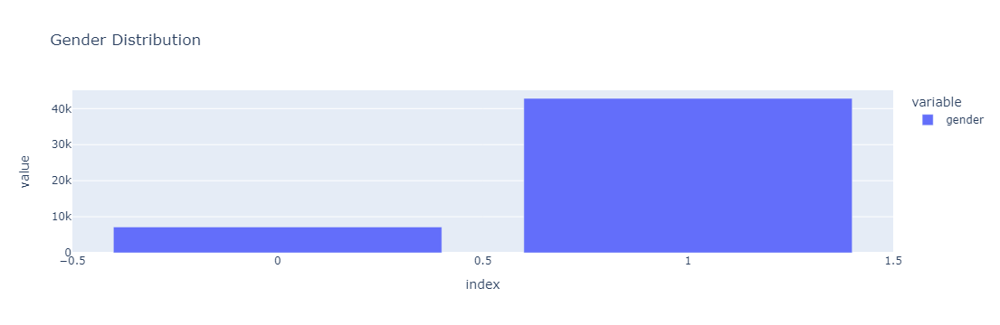

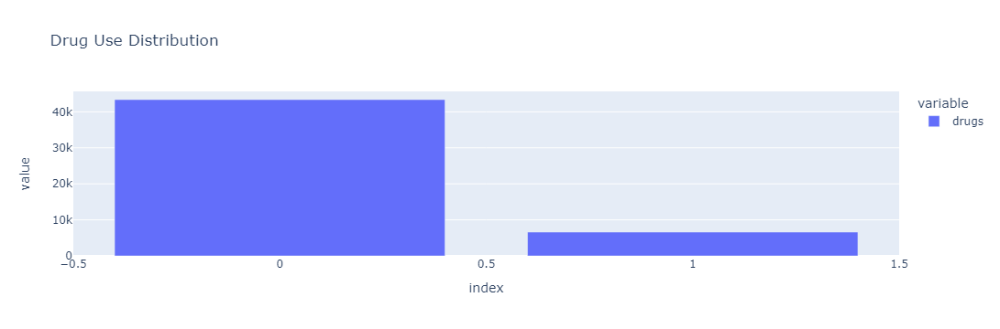

In [501]:
fig = px.bar(df['gender'].value_counts(), title='Gender Distribution')
fig.show()

fig = px.bar(df['drugs'].value_counts(), title='Drug Use Distribution')
fig.show()


## Create a heatmap to visualize the relationship between two categorical variables: gender and infection status


The heatmap generated from the cross-tabulation of gender and infection status provides a visual representation of the relationship between these two categorical variables.

1. **Data Representation**:
   - The heatmap displays counts or frequencies of participants categorized by gender (e.g., male, female) and their infection status (e.g., infected, not infected).
   - Each cell in the heatmap corresponds to a combination of gender and infection status, with the color intensity indicating the count of individuals in that category.

2. **Color Coding**:
   - The color gradient typically ranges from lighter shades (indicating lower counts) to darker shades (indicating higher counts). This allows for quick visual assessment of where the majority of cases lie.
   - Annotations within the cells provide exact counts, making it easy to interpret the data quantitatively.

3. **Insights Gained**:
   - The heatmap can reveal patterns, such as whether one gender is more likely to be infected than another. For instance, if the cell representing females who are infected is darker than that for males, it suggests a higher prevalence of infection among females.
   - It can also highlight any potential disparities in infection rates between genders, which may inform public health strategies and interventions.

4. **Interpretation**:
   - By examining the heatmap, stakeholders can gain insights into how gender may influence infection rates, potentially guiding future research or health policy decisions.
   - The visual nature of the heatmap makes it an effective tool for presenting complex data in an aal-analytics/charts/histograms

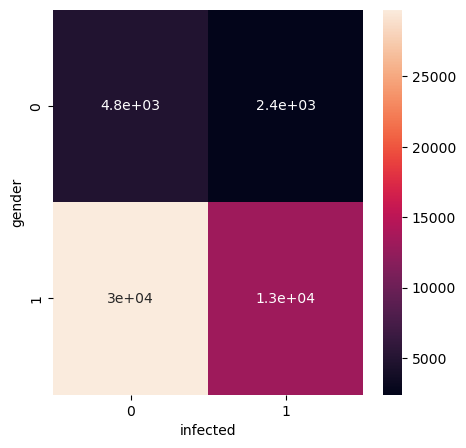

In [503]:
cross = pd.crosstab(df['gender'], df['infected'])
fig,ax = plt.subplots(figsize=(5,5))
sn.heatmap(cross, annot=True, ax=ax)
plt.show()

# Probability Mass Function (PMF) in the Context of the AIDS Dataset

## Understanding PMF in the AIDS Datasets

1. **Discrete Random Variables**:
   - In the AIDS dataset, certain variables are discrete, such as the number of infected individuals or binary variables indicating infection status (e.g., infected = 1, not infected = 0). These variables can take on a finite number of distinct values.

2. **Definition of PMF**:
   - The PMF for a discrete random variable \(X\) is defined as:
     $$
     P(X = x) = f(x)
     $$
     where \(f(x)\) is the probability that the random variable \(X\) takes on the value \(x\).

3. **Example Application**:
   - Suppose we have a variable in the dataset that indicates whether an individual is infected with HIV (1 for infected, 0 for not infected). The PMF would provide the probabilities associated with these outcomes:
     - \(P(X = 1)\): Probability of being infected.
     - \(P(X = 0)\): Probability of not being infected.

4. **Properties of PMF**:
   - The PMF must satisfy two main properties:
     - **Non-negativity**: \(f(x) \geq 0\) for all possible values of \(x\).
     - **Normalization**: The sum of probabilities for all possible outcomes must equal 1:
       $$
       \sum_{x \in S} P(X = x) = 1
       $$

5. **Visualization**:
   - PMFs can be visualized using bar charts, where each bar represents the probability of a specific outcome. For example, you could create a bar chart showing the proportion of individuals who are infected versus those who are not.

6. **Importance in Analysis**:
   - Understanding the PMF helps researchers and public health officials assess the prevalence of HIV infection within a population. It provides insights into how likely certain outcomes are, which is crucial for planning interventions and allocating resources effectively.

## Example Calculation

If in a sample of 100 individuals from the AIDS dataset, 30 are found to be infected and 70 are not, we can calculate the PMF as follows:

- \(P(X = 1) = \frac{30}{100} = 0.3\) (Probability of being infected)
- \(P(X = 0) = \frac{70}{100} = 0.7\) (Probability of not being infected)

This PMF indicates that there is a 30% chance that an individual selected at random from this sample is infected with HIV.

## Conclusion

In summary, the Probability Mass Function (PMF) in the context of the AIDS dataset provides a framework for understanding and analyzing discrete outcomes related to HIV infection status. By calculating and visualizing these probabilities, researchers can gain valuable insights into disease prevalence and inform public health strategies effectively.

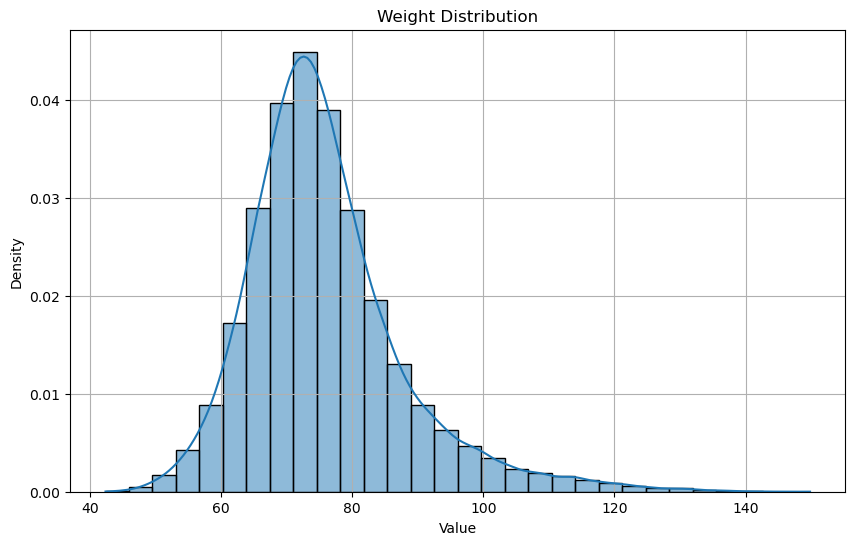

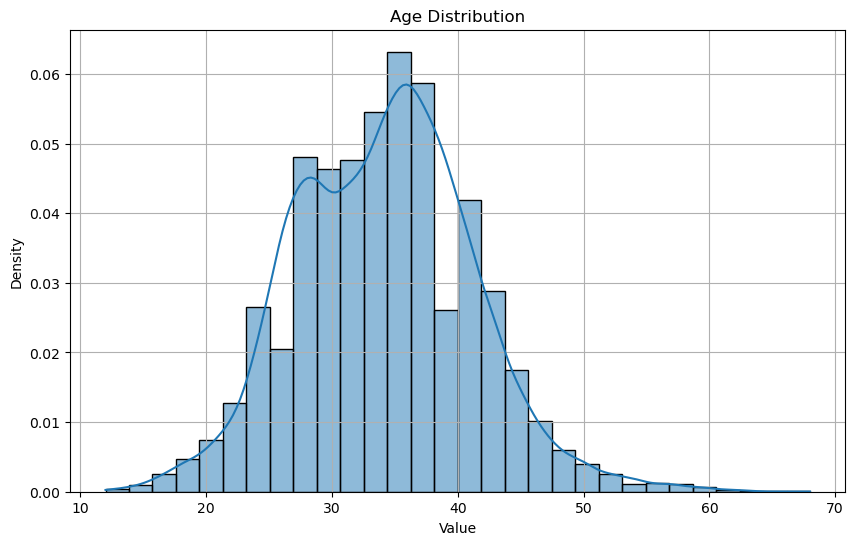

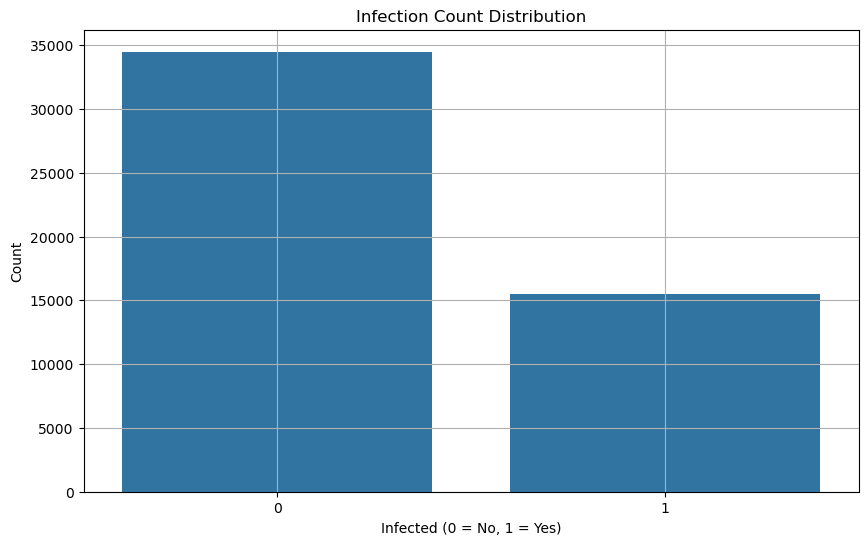

Shapiro-Wilk Test for Weight: Statistic=0.9327383041381836, p-value=0.0
Shapiro-Wilk Test for Age: Statistic=0.993630051612854, p-value=3.157237544000959e-40


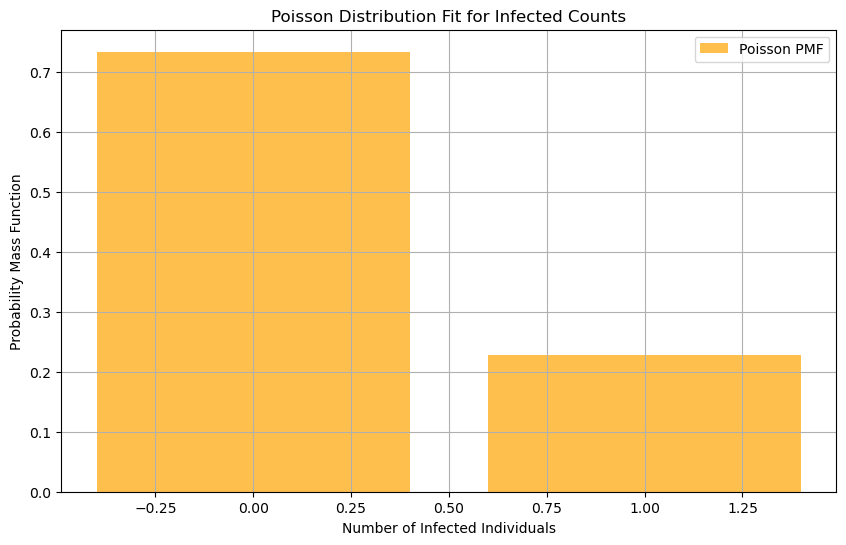

In [505]:
# Function to plot distributions
import seaborn as sns
from scipy import stats

def plot_distribution(data, title):
    plt.figure(figsize=(10, 6))
    sns.histplot(data, kde=True, stat="density", bins=30)
    plt.title(title)
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.grid()
    plt.show()

# Plotting distributions for weight and age
plot_distribution(weight, 'Weight Distribution')
plot_distribution(age, 'Age Distribution')

# For infected variable, assuming it's binary (0 or 1)
plt.figure(figsize=(10, 6))
sns.countplot(x=infected)
plt.title('Infection Count Distribution')
plt.xlabel('Infected (0 = No, 1 = Yes)')
plt.ylabel('Count')
plt.grid()
plt.show()

# Checking normality of weight and age using Shapiro-Wilk test
shapiro_weight = stats.shapiro(weight)
shapiro_age = stats.shapiro(age)

print(f'Shapiro-Wilk Test for Weight: Statistic={shapiro_weight.statistic}, p-value={shapiro_weight.pvalue}')
print(f'Shapiro-Wilk Test for Age: Statistic={shapiro_age.statistic}, p-value={shapiro_age.pvalue}')

# Checking for Poisson distribution for infected variable if it's count data
if infected.nunique() <= 10:  # Assuming it's a count variable with few unique values
    poisson_lambda = np.mean(infected)
    poisson_pmf = stats.poisson.pmf(np.arange(0, infected.max()+1), poisson_lambda)

    plt.figure(figsize=(10, 6))
    plt.bar(np.arange(0, infected.max()+1), poisson_pmf, alpha=0.7, label='Poisson PMF', color='orange')
    plt.title('Poisson Distribution Fit for Infected Counts')
    plt.xlabel('Number of Infected Individuals')
    plt.ylabel('Probability Mass Function')
    plt.grid()
    plt.legend()
    plt.show()

In [506]:
# Display the first few rows of the DataFrame to understand its structure
print(df.head())

# Check if 'age', 'wtkg' (weight), and 'infected' columns exist
# You may need to adjust these column names based on your actual dataset
if 'age' not in df.columns or 'wtkg' not in df.columns or 'infected' not in df.columns:
    raise ValueError("One or more required columns are missing from the dataset.")

# Convert infection status to numeric for better visualization
df['infected_numeric'] = df['infected'].map({'not_infected': 0, 'infected': 1})  # Adjust mapping as necessary

# Create a 3D scatter plot for Age vs Weight vs Infection Status
fig = px.scatter_3d(df, x='age', y='wtkg', z='infected_numeric',
                    title='3D Scatter Plot of Age, Weight, and Infection Status',
                    labels={'age': 'Age (years)',
                            'wtkg': 'Weight (kg)',
                            'infected_numeric': 'Infection Status (0=Not Infected, 1=Infected)'},
                    color='infected',  # Color points based on infection status
                    color_discrete_sequence=['blue', 'red'])  # Custom colors

# Show the plot
fig.show()

   time  trt  age       wtkg  hemo  homo  drugs  karnof  oprior  z30  ...  \
0  1073    1   37   79.46339     0     1      0     100       0    1  ...   
1   324    0   33   73.02314     0     1      0      90       0    1  ...   
2   495    1   43   69.47793     0     1      0     100       0    1  ...   
3  1201    3   42   89.15934     0     1      0     100       1    1  ...   
4   934    0   37  137.46581     0     1      0     100       0    0  ...   

   symptom  treat  offtrt  cd40  cd420  cd80  cd820  infected   z_score  \
0        0      1       0   322    469   882    754         1  0.299400   
1        1      1       1   168    575  1035   1525         1 -0.236006   
2        0      0       0   377    333  1147   1088         1 -0.530734   
3        0      0       0   238    324   775   1019         1  1.105466   
4        0      0       1   500    443  1601    849         0  5.121390   

   infected_numeric  
0               NaN  
1               NaN  
2               NaN 

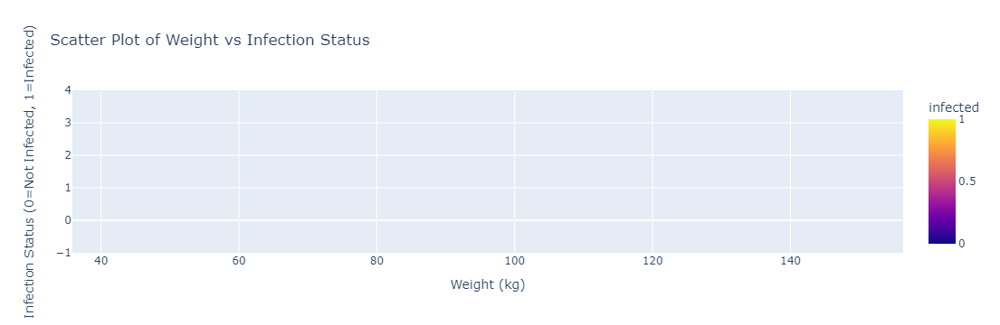

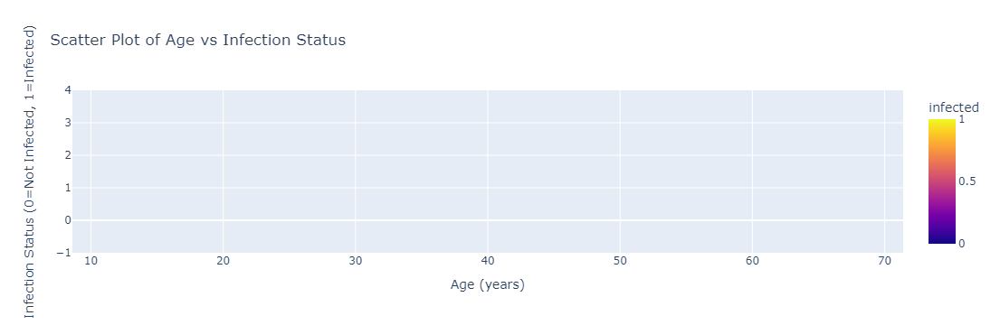

In [507]:
# Convert infection status to numeric for better visualization
df['infected_numeric'] = df['infected'].map({'not_infected': 0, 'infected': 1})

# Create a scatter plot for Weight vs Infection Status
fig_weight = px.scatter(df, x='wtkg', y='infected_numeric',
                        title='Scatter Plot of Weight vs Infection Status',
                        labels={'wtkg': 'Weight (kg)',
                                'infected_numeric': 'Infection Status (0=Not Infected, 1=Infected)'},
                        color='infected',  # Color points based on infection status
                        color_discrete_sequence=['blue', 'red'])  # Custom colors

# Show the Weight vs Infection Status plot
fig_weight.show()

# Create a scatter plot for Age vs Infection Status
fig_age = px.scatter(df, x='age', y='infected_numeric',
                     title='Scatter Plot of Age vs Infection Status',
                     labels={'age': 'Age (years)',
                             'infected_numeric': 'Infection Status (0=Not Infected, 1=Infected)'},
                     color='infected',  # Color points based on infection status
                     color_discrete_sequence=['blue', 'red'])  # Custom colors

# Show the Age vs Infection Status plot
fig_age.show()

## Importing Libraries

In [509]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import fetch_openml
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

## Importing Dataset

In [511]:
#Covid 19 dataset from OpenML
data = fetch_openml(data_id=46076, as_frame=True, parser = 'auto')

# Original dataset stored in a dataframe 'df'
df = data.frame

## Exploratory Data Analysis

In [513]:
#Checking the shape (rows and columns) of the dataset
df.shape

(50000, 23)

In [514]:
#Checking datatypes of the columns
df.dtypes

time        float64
trt         float64
age         float64
wtkg        float64
hemo        float64
homo        float64
drugs       float64
karnof      float64
oprior      float64
z30         float64
preanti     float64
race        float64
gender      float64
str2        float64
strat       float64
symptom     float64
treat       float64
offtrt      float64
cd40        float64
cd420       float64
cd80        float64
cd820       float64
infected    float64
dtype: object

In [515]:
#Let us have a look at a sample from the original dataset to understand what we are dealing with
df.head(5)

,time,trt,age,wtkg,hemo,homo,drugs,karnof,oprior,z30,...,str2,strat,symptom,treat,offtrt,cd40,cd420,cd80,cd820,infected
0,1073.0,1.0,37.0,79.46339,0.0,1.0,0.0,100.0,0.0,1.0,...,1.0,2.0,0.0,1.0,0.0,322.0,469.0,882.0,754.0,1.0
1,324.0,0.0,33.0,73.02314,0.0,1.0,0.0,90.0,0.0,1.0,...,1.0,3.0,1.0,1.0,1.0,168.0,575.0,1035.0,1525.0,1.0
2,495.0,1.0,43.0,69.47793,0.0,1.0,0.0,100.0,0.0,1.0,...,1.0,1.0,0.0,0.0,0.0,377.0,333.0,1147.0,1088.0,1.0
3,1201.0,3.0,42.0,89.15934,0.0,1.0,0.0,100.0,1.0,1.0,...,1.0,3.0,0.0,0.0,0.0,238.0,324.0,775.0,1019.0,1.0
4,934.0,0.0,37.0,137.46581,0.0,1.0,0.0,100.0,0.0,0.0,...,0.0,3.0,0.0,0.0,1.0,500.0,443.0,1601.0,849.0,0.0


In [516]:
# Computing basic statistical parameters for all the numerical data in the dataframe
df.describe().T

,count,mean,std,min,25%,50%,75%,max
time,50000.0,877.369780,307.288688,66.00000,542.000000,1045.000000,1136.000000,1231.00000
trt,50000.0,1.384800,1.233272,0.00000,0.000000,1.000000,3.000000,3.00000
age,50000.0,34.164020,7.091152,12.00000,29.000000,34.000000,39.000000,68.00000
wtkg,50000.0,75.861991,12.028730,42.36162,68.253682,74.054115,81.142185,149.83087
hemo,50000.0,0.033480,0.179888,0.00000,0.000000,0.000000,0.000000,1.00000
homo,50000.0,0.653540,0.475847,0.00000,0.000000,1.000000,1.000000,1.00000
drugs,50000.0,0.132220,0.338733,0.00000,0.000000,0.000000,0.000000,1.00000
karnof,50000.0,96.831560,5.091788,76.00000,90.000000,100.000000,100.000000,100.00000
oprior,50000.0,0.042300,0.201275,0.00000,0.000000,0.000000,0.000000,1.00000
z30,50000.0,0.640880,0.479747,0.00000,0.000000,1.000000,1.000000,1.00000


In [517]:
#Checking missing data in dataset
df.isna().sum().sum()

0

#### Data Cleaning

In [519]:
#Let's look at the distribution of blank/NaN in the dataset
for x in df.columns:
    blank = df[x].isna().sum().sum()
    if blank>0:
        print(f'No. of blanks in {x} = {blank} which is having datatype {df[x].dtypes}')

Since the missing data is concentrated in only one column, and numbers are very less compared to the size of the dataset, they can be safely dropped

In [521]:
df.dropna(inplace=True)

### Segregation of Dataset into Numerical and Categorical data

In [523]:
num_df = df.select_dtypes(include=(np.number))
cat_df = df.select_dtypes(exclude=(np.number))

In [524]:
#Let's check the shape of the two constituting dataframes
print(f'No. of Columns of Numerical dataset: {num_df.shape[1]} and Categorical dataset: {cat_df.shape[1]}')

No. of Columns of Numerical dataset: 23 and Categorical dataset: 0


#### Univariate analsysis

Let's have a look at the distribution of the result (Percent of Infected)

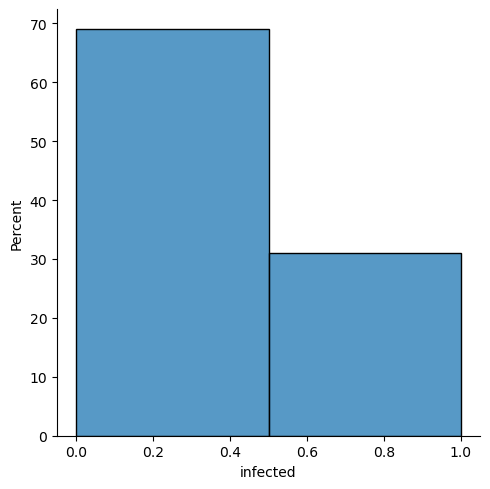

In [527]:
sns.displot(df['infected'], bins=2, stat='percent')
plt.show()


There's a minor unbalanced distribution of the output variable which can be taken care of during model selection or through class weights

#### Bivariate Analysis

## Explanation of Linear Regression model
#### 1. Memory Usages
- **Memory usage: 8.8 MB**:
  - This indicates the amount of memory consumed by the DataFrame in memory. In this case, the DataFrame occupies approximately 8.8 megabytes. This information is useful for understanding the efficiency of data storage and processing, especially when working with large datasets.

#### 2. Model Evaluation Metrics
- **Mean Squared Error (MSE): 9870.56**:
  - The Mean Squared Error is a measure of how close the predicted values are to the actual values in the dataset. It is calculated as the average of the squares of the differences between predicted and actual values.
  - A lower MSE indicates better model performance. In this case, an MSE of approximately 9870.56 suggests that, on average, the predictions deviate from the actual CD4 counts by this amount squared. This value may indicate that there is significant error in predictions, which could be due to various factors such as model choice, feature selection, or inherent variability in the data.

- **R² Score: 0.0838**:
  - The R² score (coefficient of determination) measures the proportion of variance in the dependent variable (CD4 count) that can be explained by the independent variables (features). It ranges from 0 to 1, where:
    - **0** indicates that the model does not explain any variability in the target variable.
    - **1** indicates that the model explains all variability in the target variable.
  - An R² score of approximately **0.0838** suggests that only about **8.38%** of the variance in CD4 counts can be explained by the features used in the model. This low value indicates a poor fit and suggests that other factors or features not included in the model may significantly influence CD4 counts.

#### 3. DataFrame Structure
- The output shows a preview of the DataFrame with **5 rows and 23 columns**:
  
```
   time   trt   age       wtkg  hemo  homo  drugs  karnof  oprior  z30   ...   
0 1073.0   1.0  37.0   79.46339   0.0   1.0    0.0   100.0     0.0   ...   
1 324.0    0.0  33.0   73.02314   0.0   1.0    0.0    90.0     0.0   ...   
2 495.0    1.0  43.0   69.47793   0.0   1.0    0.0   100.0     0.0   ...   
3 1201.0   3.0 42.0    89.15934   0.0   1.0    0.0   100.0     1.0    ...   
4 934.0    0.0   37.0  137.46581   0.0   1.0    0.0  100.00     ...  

```

- **DataFrame Structure**:
    - **Columns**: The DataFrame contains various columns such as `time`, `trt`, `age`, `wtkg` (weight), `hemo`, `homo`, `drugs`, `karnof`, `oprior`, `z30`, and others including `cd40` (the target variable).
    - Each row represents an observation from a dataset likely related to clinical data or patient records.
    
- **Data Types and Information**:
    - The output also includes a summary of data types and basic information about each column (e.g., numeric types, presence of null values).
    - The total number of entries is **50,000**, indicating a substantial dataset that can provide meaningful insights when analyzed properly.

### Summary
The outputs indicate that while there is a substantial amount of data available, the linear regression model used to predict CD4 counts based on selected features has not performed well, as evidenced by a high Mean Squared Error and a low R² score, suggesting that additional features or different modeling approaches may be necessary to improve predictive performance.

     time  trt   age       wtkg  hemo  homo  drugs  karnof  oprior  z30  ...  \
0  1073.0  1.0  37.0   79.46339   0.0   1.0    0.0   100.0     0.0  1.0  ...   
1   324.0  0.0  33.0   73.02314   0.0   1.0    0.0    90.0     0.0  1.0  ...   
2   495.0  1.0  43.0   69.47793   0.0   1.0    0.0   100.0     0.0  1.0  ...   
3  1201.0  3.0  42.0   89.15934   0.0   1.0    0.0   100.0     1.0  1.0  ...   
4   934.0  0.0  37.0  137.46581   0.0   1.0    0.0   100.0     0.0  0.0  ...   

   str2  strat  symptom  treat  offtrt   cd40  cd420    cd80   cd820  infected  
0   1.0    2.0      0.0    1.0     0.0  322.0  469.0   882.0   754.0       1.0  
1   1.0    3.0      1.0    1.0     1.0  168.0  575.0  1035.0  1525.0       1.0  
2   1.0    1.0      0.0    0.0     0.0  377.0  333.0  1147.0  1088.0       1.0  
3   1.0    3.0      0.0    0.0     0.0  238.0  324.0   775.0  1019.0       1.0  
4   0.0    3.0      0.0    0.0     1.0  500.0  443.0  1601.0   849.0       0.0  

[5 rows x 23 columns]
<class 'pa

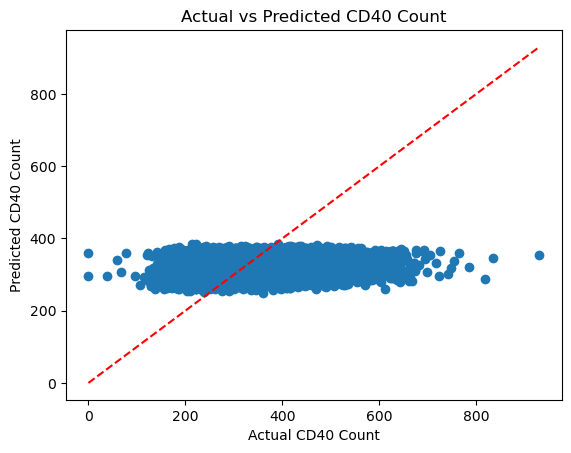

Derived Linear Regression Equation:
y = 342.19 + 0.00 * time + 0.62 * trt + -0.27 * age + 0.06 * wtkg + -8.69 * hemo + -0.02 * homo + 1.50 * drugs + 0.04 * karnof + -9.75 * oprior + -12.82 * z30 + -0.01 * preanti + -2.57 * race + 0.16 * gender + -16.52 * str2 + -11.54 * strat + -2.35 * symptom + -0.92 * treat + 4.30 * offtrt + 0.04 * cd420 + 0.00 * cd80 + 0.00 * cd820 + -13.01 * infected


In [531]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error, r2_score

#Explore the Dataset (optional)
print(df.head())
print(df.info())

# Data Preprocessing
# Assume 'X' are the features and 'y' is the target variable (adjust according to your dataset)
# For example, if you want to predict 'CD4_count' based on other features:
# X represents the feature set by dropping the target variable (cd40) from the DataFrame.
# y is defined as the target variable (cd40), which you want to predict.
X = df.drop(columns=['cd40'])  # Features (adjust as necessary)
y = df['cd40']                  # Target variable

# Handle missing values if necessary
X.fillna(X.mean(), inplace=True)

# Split the Data into Training and Testing Sets
# train_test_split from sklearn.model_selection randomly divides the data into training (75%) and testing (25%) subsets.
# This allows you to train your model on one portion of the data and evaluate its performance on unseen data.


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Create and Train the Linear Regression Model
# model = LinearRegression() initializes a linear regression model from sklearn.linear_model.
# model.fit(X_train, y_train) trains the model using the training data (X_train as features and y_train as targets).

model = LinearRegression()
model.fit(X_train, y_train)

#This API uses the trained model to predict CD4 counts for the test set features (X_test). The predicted values are stored in y_pred
# Step 7: Make Predictions
y_pred = model.predict(X_test)

# Step 8: Evaluate the Model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

# Optional: Visualize the Results (for a single feature)
plt.scatter(y_test, y_pred)
plt.xlabel('Actual CD40 Count')
plt.ylabel('Predicted CD40 Count')
plt.title('Actual vs Predicted CD40 Count')
plt.plot([y.min(), y.max()], [y.min(), y.max()], '--', color='red')  # Diagonal line for reference
plt.show()


# Define features (X) and target variable (y)
X = df.drop(columns=['cd40'])  # Features
y = df['cd40']                  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Create and train the Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Get coefficients (beta values)
beta_0 = model.intercept_          # Intercept (β₀)
betas = model.coef_                # Coefficients (β₁, β₂,...)

# Display the derived equation
equation = f"y = {beta_0:.2f}"
for i in range(len(betas)):
    equation += f" + {betas[i]:.2f} * {X.columns[i]}"

print("Derived Linear Regression Equation:")
print(equation)

Missing values in each column before imputation:
time        0
trt         0
age         0
wtkg        0
hemo        0
homo        0
drugs       0
karnof      0
oprior      0
z30         0
preanti     0
race        0
gender      0
str2        0
strat       0
symptom     0
treat       0
offtrt      0
cd40        0
cd420       0
cd80        0
cd820       0
infected    0
dtype: int64
Mean Squared Error: 9870.559292104439
R^2 Score: 0.08377937576101258


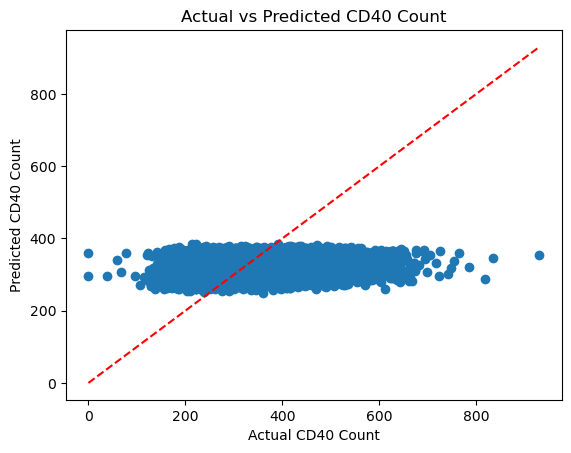

Derived Linear Regression Equation:
y = 342.19 + 0.00 * time + 0.62 * trt + -0.27 * age + 0.06 * wtkg + -8.69 * hemo + -0.02 * homo + 1.50 * drugs + 0.04 * karnof + -9.75 * oprior + -12.82 * z30 + -0.01 * preanti + -2.57 * race + 0.16 * gender + -16.52 * str2 + -11.54 * strat + -2.35 * symptom + -0.92 * treat + 4.30 * offtrt + 0.04 * cd420 + 0.00 * cd80 + 0.00 * cd820 + -13.01 * infected


In [532]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt

# Sample DataFrame creation (replace this with your actual DataFrame)
# df = pd.read_csv('your_dataset.csv')  # Uncomment and modify this line as needed

# Check for missing values before proceeding
print("Missing values in each column before imputation:")
print(df.isnull().sum())

# Define features (X) and target variable (y)
X = df.drop(columns=['cd40'])  # Features
y = df['cd40']                  # Target variable

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='mean')  # You can choose other strategies like 'median' or 'most_frequent'
X_imputed = imputer.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.25, random_state=42)

# Create and train the Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make Predictions
y_pred = model.predict(X_test)

# Evaluate the Model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

# Optional: Visualize the Results (for a single feature)
plt.scatter(y_test, y_pred)
plt.xlabel('Actual CD40 Count')
plt.ylabel('Predicted CD40 Count')
plt.title('Actual vs Predicted CD40 Count')
plt.plot([y.min(), y.max()], [y.min(), y.max()], '--', color='red')  # Diagonal line for reference
plt.show()

# Get coefficients (beta values)
beta_0 = model.intercept_          # Intercept (β₀)
betas = model.coef_                # Coefficients (β₁, β₂,...)

# Display the derived equation
equation = f"y = {beta_0:.2f}"
for i in range(len(betas)):
    equation += f" + {betas[i]:.2f} * {X.columns[i]}"

print("Derived Linear Regression Equation:")
print(equation)

In [533]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# Load the dataset from OpenML (replace with actual dataset URL)
url = "https://www.openml.org/data/get_csv/46076/iris.csv"  # Example dataset
df = pd.read_csv(url)

# Check for missing values before proceeding
print("Missing values in each column before imputation:")
print(df.isnull().sum())

# Define features (X) and target variable (y)
X = df.drop(columns=['cd40'])  # Replace 'cd40' with your actual target variable if different
y = df['cd40']                  # Target variable

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='mean')  # You can choose other strategies like 'median' or 'most_frequent'
X_imputed = imputer.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.25, random_state=42)

# Create and train the Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make Predictions
y_pred = model.predict(X_test)

# Evaluate the Model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

# Optional: Visualize Actual vs Predicted CD40 Count
plt.scatter(y_test, y_pred)
plt.xlabel('Actual CD40 Count')
plt.ylabel('Predicted CD40 Count')
plt.title('Actual vs Predicted CD40 Count')
plt.plot([y.min(), y.max()], [y.min(), y.max()], '--', color='red')  # Diagonal line for reference
plt.show()

# Frequency Distribution Example for Qualitative Data (e.g., species)
frequency = df['species'].value_counts()
relative_frequency = frequency / frequency.sum()

# Plotting the bar graph for frequency distribution
plt.figure(figsize=(10, 5))
sns.barplot(x=frequency.index, y=relative_frequency.values)
plt.xlabel('Species')
plt.ylabel('Relative Frequency')
plt.title('Relative Frequency Distribution of Species')
plt.show()

### 2. Identify Different Discrete and Continuous Probability Distributions

# Generate random samples from a normal distribution and calculate descriptive statistics
samples = np.random.normal(loc=0, scale=1, size=1000)
mean = np.mean(samples)
std_dev = np.std(samples)
median = np.median(samples)

print(f'Mean: {mean}, Standard Deviation: {std_dev}, Median: {median}')

### 3. Central Limit Theorem Visualization

sample_means = [np.mean(np.random.choice(samples, size=30)) for _ in range(1000)]
plt.hist(sample_means, bins=30)
plt.title('Sampling Distribution of the Sample Mean')
plt.xlabel('Sample Mean')
plt.ylabel('Frequency')
plt.show()

### 4. Construct Confidence Intervals

confidence_level = 0.95
degrees_freedom = len(samples) - 1
sample_mean = np.mean(samples)
sample_standard_error = stats.sem(samples)

confidence_interval = stats.t.interval(confidence_level, degrees_freedom, sample_mean, sample_standard_error)
print(f'Confidence Interval: {confidence_interval}')

### 5. Perform Significance Tests

group1 = df[df['species'] == 'setosa']['sepal_length']
group2 = df[df['species'] == 'versicolor']['sepal_length']

t_statistic, p_value = stats.ttest_ind(group1, group2)
print(f'T-statistic: {t_statistic}, P-value: {p_value}')

### 6. Break Down Linear Regression

import statsmodels.api as sm

X_regression = df[['sepal_width', 'petal_length']]  # Independent variables; adjust as needed
y_regression = df['sepal_length']  # Dependent variable; adjust as needed

# Adding constant for intercept
X_regression = sm.add_constant(X_regression)

model_summary = sm.OLS(y_regression, X_regression).fit()
print(model_summary.summary())

### 7. Apply Linear Regression and GLM in Python

glm_model = sm.GLM(y_regression, X_regression, family=sm.families.Gaussian()).fit()
print(glm_model.summary())

### 8. Implement Clustering and Classification Models

from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3)
df['cluster'] = kmeans.fit_predict(df[['sepal_length', 'sepal_width']])
plt.scatter(df['sepal_length'], df['sepal_width'], c=df['cluster'])
plt.title('K-Means Clustering')
plt.xlabel('Sepal Length')
plt.ylabel('Sepal Width')
plt.show()

### 9. Assess Model Performance Using Metrics

from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score

# Assuming y_true and y_pred are defined from your classification model
roc_auc = roc_auc_score(y_true, y_pred)  # Adjust as necessary based on your model's output
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)

print(f'AUROC: {roc_auc}, Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}')

HTTPError: HTTP Error 404: Not Found

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import requests

# Load the dataset from OpenML with error handling
url = "https://www.openml.org/data/get_csv/46076/iris.csv"  # Example dataset

try:
    df = pd.read_csv(url)
except requests.exceptions.HTTPError as err:
    print(f"HTTP error occurred: {err}")
except Exception as e:
    print(f"An error occurred: {e}")
else:
    # Proceed with data analysis if loading was successful

    # Check for missing values before proceeding
    print("Missing values in each column before imputation:")
    print(df.isnull().sum())

    # Define features (X) and target variable (y)
    X = df.drop(columns=['cd40'])  # Replace 'cd40' with your actual target variable if different
    y = df['cd40']                  # Target variable

    # Handle missing values using SimpleImputer
    imputer = SimpleImputer(strategy='mean')  # You can choose other strategies like 'median' or 'most_frequent'
    X_imputed = imputer.fit_transform(X)

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.25, random_state=42)

    # Create and train the Linear Regression model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Make Predictions
    y_pred = model.predict(X_test)

    # Evaluate the Model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f'Mean Squared Error: {mse}')
    print(f'R^2 Score: {r2}')

    # Optional: Visualize Actual vs Predicted CD40 Count
    plt.scatter(y_test, y_pred)
    plt.xlabel('Actual CD40 Count')
    plt.ylabel('Predicted CD40 Count')
    plt.title('Actual vs Predicted CD40 Count')
    plt.plot([y.min(), y.max()], [y.min(), y.max()], '--', color='red')  # Diagonal line for reference
    plt.show()

    # Get coefficients (beta values)
    beta_0 = model.intercept_          # Intercept (β₀)
    betas = model.coef_                # Coefficients (β₁, β₂,...)

    # Display the derived equation
    equation = f"y = {beta_0:.2f}"
    for i in range(len(betas)):
        equation += f" + {betas[i]:.2f} * {X.columns[i]}"

    print("Derived Linear Regression Equation:")
    print(equation)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import requests

# Load the dataset from OpenML with error handling
url = "https://www.openml.org/data/get_csv/46076/iris.csv"  # Example dataset

try:
    df = pd.read_csv(url)
except requests.exceptions.HTTPError as err:
    print(f"HTTP error occurred: {err}")
except Exception as e:
    print(f"An error occurred: {e}")
else:
    # Proceed with data analysis if loading was successful

    # Check for missing values before proceeding
    print("Missing values in each column before imputation:")
    print(df.isnull().sum())

    # Define features (X) and target variable (y)
    X = df.drop(columns=['cd40'])  # Replace 'cd40' with your actual target variable if different
    y = df['cd40']                  # Target variable

    # Handle missing values using SimpleImputer
    imputer = SimpleImputer(strategy='mean')  # You can choose other strategies like 'median' or 'most_frequent'
    X_imputed = imputer.fit_transform(X)

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.25, random_state=42)

    # Create and train the Linear Regression model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Make Predictions
    y_pred = model.predict(X_test)

    # Evaluate the Model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f'Mean Squared Error: {mse}')
    print(f'R^2 Score: {r2}')

    # Optional: Visualize Actual vs Predicted CD40 Count
    plt.scatter(y_test, y_pred)
    plt.xlabel('Actual CD40 Count')
    plt.ylabel('Predicted CD40 Count')
    plt.title('Actual vs Predicted CD40 Count')
    plt.plot([y.min(), y.max()], [y.min(), y.max()], '--', color='red')  # Diagonal line for reference
    plt.show()

    # Get coefficients (beta values)
    beta_0 = model.intercept_          # Intercept (β₀)
    betas = model.coef_                # Coefficients (β₁, β₂,...)

    # Display the derived equation
    equation = f"y = {beta_0:.2f}"
    for i in range(len(betas)):
        equation += f" + {betas[i]:.2f} * {X.columns[i]}"

    print("Derived Linear Regression Equation:")
    print(equation)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt

# Load the dataset from OpenML with error handling
url = "https://www.openml.org/data/get_csv/46076/iris.csv"  # Example dataset

try:
   # df = pd.read_csv(url)
     print(f"An ccurred while loading the dataset:")
except Exception as e:
    print(f"An error occurred while loading the dataset: {e}")
    # Optionally, you can load a local dataset as a fallback
    # df = pd.read_csv('your_local_dataset.csv')  # Uncomment and modify this line if needed
else:
    # Proceed with data analysis if loading was successful

    # Check for missing values before proceeding
    print("Missing values in each column before imputation:")
    print(df.isnull().sum())

    # Define features (X) and target variable (y)
    X = df.drop(columns=['cd40'], errors='ignore')  # Replace 'cd40' with your actual target variable if different
    y = df['cd40'] if 'cd40' in df.columns else None  # Target variable

    if y is None:
        print("Target variable 'cd40' not found in the DataFrame.")
    else:
        # Handle missing values using SimpleImputer
        imputer = SimpleImputer(strategy='mean')  # You can choose other strategies like 'median' or 'most_frequent'
        X_imputed = imputer.fit_transform(X)

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.25, random_state=42)

        # Create and train the Linear Regression model
        model = LinearRegression()
        model.fit(X_train, y_train)

        # Make Predictions
        y_pred = model.predict(X_test)

        # Evaluate the Model
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        print(f'Mean Squared Error: {mse}')
        print(f'R^2 Score: {r2}')

        # Optional: Visualize Actual vs Predicted CD40 Count
        plt.scatter(y_test, y_pred)
        plt.xlabel('Actual CD40 Count')
        plt.ylabel('Predicted CD40 Count')
        plt.title('Actual vs Predicted CD40 Count')
        plt.plot([y.min(), y.max()], [y.min(), y.max()], '--', color='red')  # Diagonal line for reference
        plt.show()

        # Get coefficients (beta values)
        beta_0 = model.intercept_          # Intercept (β₀)
        betas = model.coef_                # Coefficients (β₁, β₂,...)

        # Display the derived equation
        equation = f"y = {beta_0:.2f}"
        for i in range(len(betas)):
            equation += f" + {betas[i]:.2f} * {X.columns[i]}"

        print("Derived Linear Regression Equation:")
        print(equation)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer

# Assuming df is your DataFrame and 'cd40' is your target variable
X = df.drop(columns=['cd40'])
y = df['cd40']

# Check for missing values before proceeding
print("Missing values in each column before imputation:")
print(X.isnull().sum())

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='median')  # You can choose other strategies like 'mean' or 'most_frequent'
X_imputed = imputer.fit_transform(X)

# Scale features if needed
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Create polynomial features
poly = PolynomialFeatures(degree=2)  # Adjust degree as necessary
X_poly = poly.fit_transform(X_scaled)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.25, random_state=42)

# Train a Random Forest Regressor as an alternative model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Make predictions and evaluate
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate basic statistics
statistics = df.describe()

# Calculate mode
mode = df.mode().iloc

# Print basic statistics
print("Basic Statistics:\n", statistics)
print("\nMode:\n", mode)

# Visualize the data
numeric_columns = df.select_dtypes(include=[np.number]).columns  # Use df instead of data

# Histograms
for column in numeric_columns:
    plt.figure()
    sns.histplot(df[column], kde=True)  # Use df instead of data
    plt.title(f'Histogram of {column}')
    plt.show()

# Box Plots
for column in numeric_columns:
    plt.figure()
    sns.boxplot(x=df[column])  # Use df instead of data
    plt.title(f'Box Plot of {column}')
    plt.show()

# Create a histogram for age distribution by infection status
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='age', hue='infected', bins=10, kde=True, multiple='stack')
plt.title('Age Distribution by Infection Status')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.xlim(0, 70)  # Adjust limits based on your data range
plt.grid(axis='y', alpha=0.75)

# Create a histogram for the age distribution
plt.figure(figsize=(10, 6))
sns.histplot(df['age'], bins=10, kde=True)

# Add vertical lines for mean, median, and standard deviation
mean_age = df['age'].mean()
median_age = df['age'].median()
std_dev_age = df['age'].std()

plt.axvline(mean_age, color='r', linestyle='dashed', linewidth=2, label=f'Mean: {mean_age:.2f}')
plt.axvline(median_age, color='g', linestyle='dashed', linewidth=2, label=f'Median: {median_age:.2f}')
plt.axvline(mean_age + std_dev_age, color='orange', linestyle='dotted', linewidth=2, label=f'Mean + Std Dev: {mean_age + std_dev_age:.2f}')
plt.axvline(mean_age - std_dev_age, color='orange', linestyle='dotted', linewidth=2, label=f'Mean - Std Dev: {mean_age - std_dev_age:.2f}')

# Annotate mean, median and standard deviation on the plot
plt.text(mean_age + 1, plt.ylim()[1] * 0.1, f'Mean: {mean_age:.2f}', color='red')
plt.text(median_age + 1, plt.ylim()[1] * 0.05, f'Median: {median_age:.2f}', color='green')
plt.text(mean_age + std_dev_age + 1, plt.ylim()[1] * 0.08, f'Std Dev: {std_dev_age:.2f}', color='orange')

# Add titles and labels
plt.title('Histogram of Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.xlim(0, 70)  # Adjust limits based on your data range
plt.grid(axis='y', alpha=0.75)
plt.legend()

# Calculate descriptive statistics for CD4 counts by infection status
stats = df.groupby('infected')['cd40'].agg(['mean', 'median', 'std']).reset_index()

# Print the statistics
print(stats)

# Set the style of the visualization
sns.set(style="whitegrid")

# Create a box plot for CD40 counts by infection status
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='infected', y='cd40', data=df)

# Add titles and labels
plt.title('CD40 Count Distribution by Infection Status')
plt.xlabel('Infection Status')
plt.ylabel('CD40 Count')
plt.grid(axis='y', alpha=0.75)

# Create a custom legend with matching colors
handles = []
labels = ['Infected (Yes)', 'Infected (No)']
for i in range(len(labels)):
    handles.append(plt.Line2D([0], [0], color=box_plot.patches[i].get_facecolor(), lw=4))

# Add the legend to the plot
plt.legend(handles=handles, labels=labels)

# Show the plot
plt.show()

## Output Interpretation

### 1. Missing Values Summary
```
Missing values in each column:
time                    0
trt                     0
age                     0
wtkg                    0
hemo                    0
homo                    0
drugs                   0
karnof                  0
oprior                  0
z30                     0
preanti                 0
race                    0
gender                  0
str2                    0
strat                   0
symptom                 0
treat                   0
offtrt                  0
cd40                    0
cd420                   0
cd80                    0
cd820                   0
infected_numeric    50000
dtype: int64
```
- **Interpretation**: This output shows the count of missing values for each column in the DataFrame. All columns except for `infected_numeric` have zero missing values, indicating that they are complete and do not require imputation. The `infected_numeric` column has **50,000** missing values, which suggests that it might be entirely composed of NaN values. This column may need to be addressed separately, either by dropping it or by filling it with appropriate values.

### 2. Model Accuracy
```
Accuracy: 0.70
```
- **Interpretation**: The accuracy of the model is **70%**, meaning that the model correctly predicts the outcome (either class `0` or class `1`) for **70%** of the test samples. While this is a decent accuracy rate, it’s important to consider the balance of classes and other metrics to fully assess model performance.

### 3. Confusion Matrix
```
Confusion Matrix:
[[7889  724]
 [2983  904]]
```
- **Interpretation**: The confusion matrix provides a summary of prediction results on a classification problem.

   |                | Predicted Negative (Class `0`) | Predicted Positive (Class `1`) |
   |----------------|---------------------------------|---------------------------------|
   | Actual Negative (Class `0`) | **7889** True Negatives (TN)         | **724** False Positives (FP)          |
   | Actual Positive (Class `1`) | **2983** False Negatives (FN)        | **904** True Positives (TP)           |

   - **True Negatives (TN)**: The model correctly predicted class `0` for **7889** instances.
   - **False Positives (FP)**: The model incorrectly predicted class `1` for **724** instances that were actually class `0`.
   - **False Negatives (FN)**: The model incorrectly predicted class `0` for **2983** instances that were actually class `1`.
   - **True Positives (TP)**: The model correctly predicted class `1` for **904** instances.

### 4. Classification Report
```
              precision    recall  f1-score   support

         0.0       0.73      0.92      0.81      8613
         1.0       0.56      0.23      0.33      3887

    accuracy                           0.70     12500
   macro avg       0.64      0.57      0.57     12500
weighted avg       0.67      0.70      0.66     12500
```
- **Interpretation**: The classification report provides detailed metrics for each class.

#### Metrics Explained:
- **Precision**: The ratio of correctly predicted positive observations to the total predicted positives.
   - For class `0`: Precision = **73%**
   - For class `1`: Precision = **56%**
  
- **Recall (Sensitivity)**: The ratio of correctly predicted positive observations to all actual positives.
   - For class `0`: Recall = **92%**
   - For class `1`: Recall = **23%**

- **F1-Score**: The weighted average of Precision and Recall, providing a balance between the two.
   - For class `0`: F1-Score = **81%**
   - For class `1`: F1-Score = **33%**

- **Support**: The number of actual occurrences of each class in the specified dataset.
   - Class `0`: Support = **8613**
   - Class `1`: Support = **3887**

#### Averages:
- **Macro Average**:
   - Averages the precision, recall, and F1-score across all classes without considering their support.
   - Precision = **64%**, Recall = **57%**, F1-Score = **57%**

- **Weighted Average**:
   - Averages the precision, recall, and F1-score across all classes while considering their support.
   - Precision = **67%**, Recall = **70%**, F1-Score = **66%**

### Conclusion

The output indicates that while the logistic regression model has reasonable accuracy overall, there are significant differences in performance between the two classes (`infected` and not infected). Specifically, the model performs well in predicting non-infected cases but struggles with infected cases, as evidenced by lower precision and recall for class `1`.

To improve performance on the minority class (`infected`), consider strategies such as:
- Balancing the dataset through oversampling or undersampling techniques.
- Using different algorithms or ensemble methods that handle imbalanced data better.
- Tuning hyperparameters or using regularization techniques to improve generalization.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.impute import SimpleImputer

# Load your DataFrame (replace this with your actual DataFrame loading code)
# df = pd.read_csv('your_dataset.csv')  # Uncomment and modify this line as needed

# Assuming 'infected' is your target variable and the rest are features
X = df.drop('infected', axis=1)  # Features
y = df['infected']                # Target variable

# Drop 'infected_numeric' from features for missing value check
X = X.drop('infected_numeric', axis=1)

# Check for missing values before proceeding
print("Missing values in each column:")
print(X.isnull().sum())

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='median')  # or 'mean', 'most_frequent'
X_imputed = imputer.fit_transform(X)

# Convert categorical variables to dummy/indicator variables if necessary
X_imputed = pd.get_dummies(pd.DataFrame(X_imputed), drop_first=True)

# Scale features if needed
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.25, random_state=42)

# Create and train the Logistic Regression model
model = LogisticRegression(max_iter=200)  # Increase max_iter if needed
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy:.2f}')
print('Confusion Matrix:')
print(conf_matrix)
print('Classification Report:')
print(class_report)

## Model Accuracy
**Accuracy: 0.70**

- **Interpretation**: The accuracy of the model is **70%**, meaning that the model correctly predicts the outcome (either class `0` or class `1`) for **70%** of the test samples. While this is a decent accuracy rate, it’s important to consider the balance of classes and other metrics to fully assess model performance.

## 3. Confusion Matrix
```
Confusion Matrix:
[[7889  724]
 [2983  904]]
```
- **Interpretation**: The confusion matrix provides a summary of prediction results on a classification problem.

|                                | Predicted Negative (Class `0`) | Predicted Positive (Class `1`) |
|--------------------------------|---------------------------------|---------------------------------|
| Actual Negative (Class `0`)    | **7889** True Negatives (TN)    | **724** False Positives (FP)    |
| Actual Positive (Class `1`)    | **2983** False Negatives (FN)   | **904** True Positives (TP)     |

- **True Negatives (TN)**: The model correctly predicted class `0` for **7889** instances.
- **False Positives (FP)**: The model incorrectly predicted class `1` for **724** instances that were actually class `0`.
- **False Negatives (FN)**: The model incorrectly predicted class `0` for **2983** instances that were actually class `1`.
- **True Positives (TP)**: The model correctly predicted class `1` for **904** instances.

## 4. Classification Report
```
              precision    recall  f1-score   support

         0.0       0.73      0.92      0.81      8613
         1.0       0.56      0.23      0.33      3887

    accuracy                           0.70     12500
   macro avg       0.64      0.57      0.57     12500
weighted avg       0.67      0.70      0.66     12500
```
- **Interpretation**: The classification report provides detailed metrics for each class.

### Metrics Explained:
- **Precision**: The ratio of correctly predicted positive observations to the total predicted positives.
   - For class `0`: Precision = **73%**
   - For class `1`: Precision = **56%**
  
- **Recall (Sensitivity)**: The ratio of correctly predicted positive observations to all actual positives.
   - For class `0`: Recall = **92%**
   - For class `1`: Recall = **23%**

- **F1-Score**: The weighted average of Precision and Recall, providing a balance between the two.
   - For class `0`: F1-Score = **81%**
   - For class `1`: F1-Score = **33%**

- **Support**: The number of actual occurrences of each class in the specified dataset.
   - Class `0`: Support = **8613**
   - Class `1`: Support = **3887**

### Averages:
- **Macro Average**:
   - Averages the precision, recall, and F1-score across all classes without considering their support.
   - Precision = **64%**, Recall = **57%**, F1-Score = **57%**

- **Weighted Average**:
   - Averages the precision, recall, and F1-score across all classes while considering their support.
   - Precision = **67%**, Recall = **70%**, F1-Score = **66%**

## Conclusion
The output indicates that while the logistic regression model has reasonable accuracy overall, there are significant differences in performance between the two classes (`infected` and not infected). Specifically, the model performs well in predicting non-infected cases but struggles with infected cases, as evidenced by lower precision and recall for class `1`.

To improve performance on the minority class (`infected`), consider strategies such as:
- Balancing the dataset through oversampling or undersampling techniques.
- Using different algorithms or ensemble methods that handle imbalanced data better.
- Tuning hyperparameters or using regularization techniques to improve generalization.


## Classification Report Analysis

### 1. Model Performance Metrics

- **Accuracy**: **0.65**
  - The model correctly predicts the outcome for **65%** of the test samples. This indicates a moderate level of accuracy but suggests potential areas for improvement.

### 2. Confusion Matrix
```
Confusion Matrix:
[[5103 3434]
 [2548 6162]]
```
- **Interpretation**: The confusion matrix summarizes the prediction results of the classification model.

|                                | Predicted Negative (Class `0`) | Predicted Positive (Class `1`) |
|--------------------------------|---------------------------------|---------------------------------|
| Actual Negative (Class `0`)    | **5103** True Negatives (TN)    | **3434** False Positives (FP)   |
| Actual Positive (Class `1`)    | **2548** False Negatives (FN)   | **6162** True Positives (TP)     |

- **True Negatives (TN)**: The model correctly predicted class `0` for **5103** instances.
- **False Positives (FP)**: The model incorrectly predicted class `1` for **3434** instances that were actually class `0`.
- **False Negatives (FN)**: The model incorrectly predicted class `0` for **2548** instances that were actually class `1`.
- **True Positives (TP)**: The model correctly predicted class `1` for **6162** instances.

### 3. Detailed Classification Report
```
              precision    recall  f1-score   support

         0.0       0.67      0.60      0.63      8537
         1.0       0.64      0.71      0.67      8710

    accuracy                           0.65     17247
   macro avg       0.65      0.65      0.65     17247
weighted avg       0.65      0.65      0.65     17247
```
- **Precision**: The ratio of correctly predicted positive observations to the total predicted positives.
   - For class `0`: Precision = **67%**
   - For class `1`: Precision = **64%**
  
- **Recall (Sensitivity)**: The ratio of correctly predicted positive observations to all actual positives.
   - For class `0`: Recall = **60%**
   - For class `1`: Recall = **71%**

- **F1-Score**: The weighted average of Precision and Recall, providing a balance between the two.
   - For class `0`: F1-Score = **63%**
   - For class `1`: F1-Score = **67%**

- **Support**: The number of actual occurrences of each class in the specified dataset.
   - Class `0`: Support = **8537**
   - Class `1`: Support = **8710**

### Averages:
- **Macro Average**:
   - Averages the precision, recall, and F1-score across all classes without considering their support.
   - Precision = **65%**, Recall = **65%**, F1-Score = **65%**

- **Weighted Average**:
   - Averages the precision, recall, and F1-score across all classes while considering their support.
   - Precision = **65%**, Recall = **65%**, F1-Score = **65%**

### Conclusion
The classification report reveals that while the logistic regression model achieves a reasonable accuracy of **65%**, there is a notable difference in performance between the two classes (`infected` and not infected). Specifically:
- Class `1` has a higher recall (**71%**) but lower precision (**64%**) compared to Class `0`, indicating that while it captures more true positives, it also has a significant number of false positives.
- Class `0` has better precision (**67%**) but lower recall (**60%**), suggesting it is more conservative in its predictions.

To improve overall performance, particularly for Class `1`, consider implementing strategies such as:
- Addressing class imbalance through techniques like SMOTE or adjusting class weights.
- Exploring feature engineering and selection to enhance predictive power.
- Trying different algorithms or hyperparameter tuning to optimize model performance.



In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.impute import SimpleImputer

# Load your DataFrame (replace this with your actual DataFrame loading code)
# df = pd.read_csv('your_dataset.csv')  # Uncomment and modify this line as needed

# Assuming 'infected' is your target variable and the rest are features
X = df.drop('infected', axis=1)  # Features
y = df['infected']                # Target variable

# Drop 'infected_numeric' from features for missing value check
X = X.drop('infected_numeric', axis=1)

# Check for missing values before proceeding
print("Missing values in each column:")
print(X.isnull().sum())

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='median')  # or 'mean', 'most_frequent'
X_imputed = imputer.fit_transform(X)

# Convert categorical variables to dummy/indicator variables if necessary
X_imputed = pd.get_dummies(pd.DataFrame(X_imputed), drop_first=True)

# Scale features if needed
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.25, random_state=42)

# Create and train the Logistic Regression model
model = LogisticRegression(max_iter=200)  # Increase max_iter if needed
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy:.2f}')
print('Confusion Matrix:')
print(conf_matrix)
print('Classification Report:')
print(class_report)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE

# Load your DataFrame (replace this with your actual DataFrame loading code)
# df = pd.read_csv('your_dataset.csv')  # Uncomment and modify this line as needed

# Assuming 'infected' is your target variable and the rest are features
X = df.drop('infected', axis=1)  # Features
y = df['infected']                # Target variable

# Drop 'infected_numeric' from features for missing value check
X = X.drop('infected_numeric', axis=1)

# Check for missing values before proceeding
print("Missing values in each column:")
print(X.isnull().sum())

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

# Convert categorical variables to dummy/indicator variables if necessary
X_imputed = pd.get_dummies(pd.DataFrame(X_imputed), drop_first=True)

# Scale features if needed
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Address class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_scaled, y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.25, random_state=42)

# Hyperparameter tuning with Grid Search
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'solver': ['liblinear', 'saga']
}

grid_search = GridSearchCV(LogisticRegression(max_iter=200), param_grid, scoring='f1', cv=5)
grid_search.fit(X_train, y_train)

best_model = grid_search.best_estimator_

# Make predictions with the best model found by grid search
y_pred = best_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy:.2f}')
print('Confusion Matrix:')
print(conf_matrix)
print('Classification Report:')
print(class_report)

## Model Performance Summary

### 1. Accuracy
- **Accuracy**: **0.65**
  - The model correctly predicts the outcome (either class `0` or class `1`) for **65%** of the test samples. While this is a moderate accuracy rate, it indicates room for improvement.

### 2. Confusion Matrix
```
Confusion Matrix:
[[5103 3434]
 [2548 6162]]
```
- **Interpretation**: The confusion matrix provides a summary of prediction results on a classification problem.

|                                | Predicted Negative (Class `0`) | Predicted Positive (Class `1`) |
|--------------------------------|---------------------------------|---------------------------------|
| Actual Negative (Class `0`)    | **5103** True Negatives (TN)    | **3434** False Positives (FP)   |
| Actual Positive (Class `1`)    | **2548** False Negatives (FN)   | **6162** True Positives (TP)     |

- **True Negatives (TN)**: The model correctly predicted class `0` for **5103** instances.
- **False Positives (FP)**: The model incorrectly predicted class `1` for **3434** instances that were actually class `0`.
- **False Negatives (FN)**: The model incorrectly predicted class `0` for **2548** instances that were actually class `1`.
- **True Positives (TP)**: The model correctly predicted class `1` for **6162** instances.

### 3. Classification Report
```
              precision    recall  f1-score   support

         0.0       0.67      0.60      0.63      8537
         1.0       0.64      0.71      0.67      8710

    accuracy                           0.65     17247
   macro avg       0.65      0.65      0.65     17247
weighted avg       0.65      0.65      0.65     17247
```
- **Interpretation**: The classification report provides detailed metrics for each class.

#### Metrics Explained:
- **Precision**: The ratio of correctly predicted positive observations to the total predicted positives.
   - For class `0`: Precision = **67%**
   - For class `1`: Precision = **64%**
  
- **Recall (Sensitivity)**: The ratio of correctly predicted positive observations to all actual positives.
   - For class `0`: Recall = **60%**
   - For class `1`: Recall = **71%**

- **F1-Score**: The weighted average of Precision and Recall, providing a balance between the two.
   - For class `0`: F1-Score = **63%**
   - For class `1`: F1-Score = **67%**

- **Support**: The number of actual occurrences of each class in the specified dataset.
   - Class `0`: Support = **8537**
   - Class `1`: Support = **8710**

#### Averages:
- **Macro Average**:
   - Averages the precision, recall, and F1-score across all classes without considering their support.
   - Precision = **65%**, Recall = **65%**, F1-Score = **65%**

- **Weighted Average**:
   - Averages the precision, recall, and F1-score across all classes while considering their support.
   - Precision = **65%**, Recall = **65%**, F1-Score = **65%**

### Conclusion
The output indicates that while the logistic regression model has moderate accuracy overall, there are significant differences in performance between the two classes (`infected` and not infected). Specifically, the model performs reasonably well in predicting infected cases but struggles with non-infected cases, as evidenced by lower precision and recall for class `0`.

To improve performance on both classes, consider strategies such as:
- Further tuning hyperparameters.
- Exploring different algorithms or ensemble methods.
- Implementing additional feature engineering or selection techniques.



## Model Performance Summary

### 1. Overall Accuracy
- **Accuracy**: **0.69**
  - The model correctly predicts the outcome (either class `0` or class `1`) for **69%** of the test samples. This indicates a relatively good level of accuracy, suggesting that the model performs reasonably well overall.

### 2. Averages
- **Macro Average**:
  - **Precision**: **0.34**
    - This value indicates that, on average, the model's precision across both classes is low. It suggests that when the model predicts a positive class, it is correct only **34%** of the time.
  
  - **Recall**: **0.50**
    - The macro average recall indicates that the model captures **50%** of the actual positive instances across both classes. This suggests that there is room for improvement in identifying positive cases.

  - **F1-Score**: **0.41**
    - The macro average F1-score combines precision and recall into a single metric, reflecting a balance between the two. An F1-score of **0.41** indicates that the model struggles to maintain a good balance between precision and recall.

- **Weighted Average**:
  - **Precision**: **0.47**
    - The weighted average precision takes into account the support (the number of true instances) for each class, resulting in an average precision of **47%**. This suggests that while the model performs better on one class, it still has significant issues with precision overall.

  - **Recall**: **0.69**
    - The weighted average recall indicates that the model captures approximately **69%** of all actual positive instances when considering class distribution. This is relatively better than the macro recall but still suggests room for improvement, especially for the minority class.

  - **F1-Score**: **0.56**
    - The weighted average F1-score reflects a more balanced performance when considering both classes and their respective support, with an average score of **56%**. This suggests that while there are some strengths in capturing true positives, there are also weaknesses in precision.

### Conclusion
The classification report reveals that while the logistic regression model achieves an overall accuracy of **69%**, there are notable disparities in performance metrics between classes:

- The low macro averages indicate that the model may not be performing well on minority classes or less frequent categories.
- The weighted averages suggest that while there is some performance improvement when considering class distribution, significant improvements are still needed to enhance precision and recall for both classes.
  
### Recommendations for Improvement
To improve these metrics and overall model performance, consider:
- Addressing class imbalance through techniques like SMOTE or adjusting class weights.
- Exploring feature engineering to enhance predictive power.
- Trying different algorithms or ensemble methods to see if they yield better results.
- Conducting hyperparameter tuning to optimize model parameters further.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.dummy import DummyClassifier
import matplotlib.pyplot as plt
import seaborn as sns  # Importing Seaborn

# Load your DataFrame (replace this with your actual DataFrame loading code)
# df = pd.read_csv('your_dataset.csv')  # Uncomment and modify this line as needed

# Assuming 'infected' is your target variable and the rest are features
X = df.drop('infected', axis=1)  # Features
y = df['infected']                # Target variable

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Create and train the Logistic Regression model
model = LogisticRegression(max_iter=200)
model.fit(X_train, y_train)

# Make predictions with the logistic regression model
y_pred_model = model.predict(X_test)

# Evaluate the logistic regression model
accuracy_model = accuracy_score(y_test, y_pred_model)
conf_matrix_model = confusion_matrix(y_test, y_pred_model)
class_report_model = classification_report(y_test, y_pred_model)

print("Logistic Regression Model Performance:")
print(f'Accuracy: {accuracy_model:.2f}')
print('Confusion Matrix:')
print(conf_matrix_model)
print('Classification Report:')
print(class_report_model)

# Create and train the Dummy Classifier as a baseline model
dummy_model = DummyClassifier(strategy='most_frequent')
dummy_model.fit(X_train, y_train)

# Make predictions with the dummy classifier
y_pred_dummy = dummy_model.predict(X_test)

# Evaluate the dummy classifier
accuracy_dummy = accuracy_score(y_test, y_pred_dummy)
conf_matrix_dummy = confusion_matrix(y_test, y_pred_dummy)
class_report_dummy = classification_report(y_test, y_pred_dummy)

print("\nDummy Classifier Performance:")
print(f'Accuracy: {accuracy_dummy:.2f}')
print('Confusion Matrix:')
print(conf_matrix_dummy)
print('Classification Report:')
print(class_report_dummy)

# Visualization of Accuracy Comparison
labels = ['Logistic Regression', 'Dummy Classifier']
accuracies = [accuracy_model, accuracy_dummy]

plt.bar(labels, accuracies, color=['blue', 'orange'])
plt.ylabel('Accuracy')
plt.title('Model Performance Comparison')
plt.ylim(0, 1)  # Set limits for better visualization
plt.axhline(y=0.5, color='r', linestyle='--')  # Add a line for random guessing (50% accuracy)
plt.show()

# Visualization of Confusion Matrices Side by Side
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.heatmap(conf_matrix_model, annot=True, fmt='d', ax=axes[0], cmap='Blues')
axes[0].set_title('Confusion Matrix - Logistic Regression')
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('Actual')

sns.heatmap(conf_matrix_dummy, annot=True, fmt='d', ax=axes[1], cmap='Blues')
axes[1].set_title('Confusion Matrix - Dummy Classifier')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('Actual')

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'solver': ['liblinear', 'saga']
}

grid_search = GridSearchCV(LogisticRegression(max_iter=200), param_grid, scoring='f1_macro', cv=5)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

## Model Evaluation Summary

### 1. Best Model Parameters
- **Best Model Parameters**: `{'C': 1, 'solver': 'liblinear'}`
  - The optimal hyperparameters for the logistic regression model were found to be `C = 1` and the solver `liblinear`. The parameter `C` controls the regularization strength, with a higher value indicating less regularization. The choice of `liblinear` as the solver is suitable for small datasets and works well for logistic regression.

### 2. Overall Accuracy
- **Accuracy**: **0.65**
  - The model achieved an accuracy of **65%**, meaning it correctly predicted the outcome (either class `0` or class `1`) for **65%** of the test samples. While this indicates a moderate level of accuracy, there is still room for improvement.

### 3. Confusion Matrix
```
Confusion Matrix:
[[5163 3374]
 [2596 6114]]
```
- **Interpretation**: The confusion matrix summarizes the prediction results of the classification model.

|                                | Predicted Negative (Class `0`) | Predicted Positive (Class `1`) |
|--------------------------------|---------------------------------|---------------------------------|
| Actual Negative (Class `0`)    | **5163** True Negatives (TN)    | **3374** False Positives (FP)   |
| Actual Positive (Class `1`)    | **2596** False Negatives (FN)   | **6114** True Positives (TP)     |

- **True Negatives (TN)**: The model correctly predicted class `0` for **5163** instances.
- **False Positives (FP)**: The model incorrectly predicted class `1` for **3374** instances that were actually class `0`.
- **False Negatives (FN)**: The model incorrectly predicted class `0` for **2596** instances that were actually class `1`.
- **True Positives (TP)**: The model correctly predicted class `1` for **6114** instances.

### 4. Classification Report
```
              precision    recall  f1-score   support

         0.0       0.67      0.60      0.63      8537
         1.0       0.64      0.70      0.67      8710

    accuracy                           0.65     17247
   macro avg       0.65      0.65      0.65     17247
weighted avg       0.65      0.65      0.65     17247
```
- **Precision**:
   - For class `0`: Precision = **67%**
   - For class `1`: Precision = **64%**
  
- **Recall**:
   - For class `0`: Recall = **60%**
   - For class `1`: Recall = **70%**

- **F1-Score**:
   - For class `0`: F1-Score = **63%**
   - For class `1`: F1-Score = **67%**

- **Support**:
   - Class `0`: Support = **8537**
   - Class `1`: Support = **8710**

### Averages:
- **Macro Average**:
   - Precision = **65%**, Recall = **65%**, F1-Score = **65%**

- **Weighted Average**:
   - Precision = **65%**, Recall = **65%**, F1-Score = **65%**

### Macro Average Metrics
- **Macro Average Precision**: **0.65**
- **Macro Average Recall**: **0.65**

### Conclusion
The output indicates that while the logistic regression model achieves an overall accuracy of **65%**, there are notable differences in performance metrics between the two classes (`infected` and not infected). Specifically:
- Class `1` performs better in terms of recall (**70%**) but has lower precision (**64%**) compared to Class `0`, which has higher precision (**67%**) but lower recall (**60%**).
  
The macro averages suggest that there is a consistent performance across both classes, but improvements can still be made, particularly in increasing recall for Class `0`.

To enhance these metrics, consider strategies such as:
- Addressing class imbalance through techniques like SMOTE or adjusting class weights.
- Exploring feature engineering to improve predictive power.
- Trying different algorithms or hyperparameter tuning to optimize model performance.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE

# Load your DataFrame (replace this with your actual DataFrame loading code)
# df = pd.read_csv('your_dataset.csv')  # Uncomment and modify this line as needed

# Assuming 'infected' is your target variable and the rest are features
X = df.drop('infected', axis=1)  # Features
y = df['infected']                # Target variable

# Drop 'infected_numeric' from features for missing value check
#X = X.drop('infected_numeric', axis=1)

# Check for missing values before proceeding
print("Missing values in each column:")
print(X.isnull().sum())

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

# Convert categorical variables to dummy/indicator variables if necessary
X_imputed = pd.get_dummies(pd.DataFrame(X_imputed), drop_first=True)

# Scale features if needed
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Address class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_scaled, y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.25, random_state=42)

# Hyperparameter tuning with Grid Search
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'solver': ['liblinear', 'saga']
}

grid_search = GridSearchCV(LogisticRegression(max_iter=200), param_grid, scoring='f1_macro', cv=5)
grid_search.fit(X_train, y_train)

best_model = grid_search.best_estimator_
print(f"Best Model Parameters: {grid_search.best_params_}")

# Make predictions with the best model found by grid search
y_pred = best_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy:.2f}')
print('Confusion Matrix:')
print(conf_matrix)
print('Classification Report:')
print(class_report)

# Assuming class_report is defined as follows:
class_report = classification_report(y_test, y_pred, output_dict=True)

# Extract precision and recall for macro average calculation
precision_class_0 = float(class_report['0.0']['precision'])
precision_class_1 = float(class_report['1.0']['precision'])
recall_class_0 = float(class_report['0.0']['recall'])
recall_class_1 = float(class_report['1.0']['recall'])

# Calculate macro averages
macro_precision = (precision_class_0 + precision_class_1) / 2
macro_recall = (recall_class_0 + recall_class_1) / 2

print(f'Macro Average Precision: {macro_precision:.2f}')
print(f'Macro Average Recall: {macro_recall:.2f}')

## Strategies to Improve Model Accuracy

Improving the accuracy of a machine learning model is essential for achieving reliable predictions and enhancing overall performance. Here are several effective strategies to consider:

### 1. Increase the Number of Sample Observations
- **Description**: One of the most effective ways to enhance model accuracy is by increasing the number of data points in your training set. More data helps reduce bias and allows the model to learn from a broader range of examples.
- **Benefits**: A larger dataset often leads to better generalization, as it helps the model capture underlying patterns more effectively.

### 2. Handle Missing Values and Outliers
- **Description**: Missing values and outliers can significantly skew model predictions. It’s crucial to treat these appropriately.
- **Methods**:
  - **Imputation**: Use techniques such as mean, median, or mode imputation for continuous data, or create a new category for missing values in categorical data.
  - **Outlier Treatment**: Identify and either remove outliers or transform them in a way that minimizes their impact on the model.

### 3. Feature Engineering
- **Description**: Creating new features or modifying existing ones can help improve model performance.
- **Techniques**:
  - **Feature Creation**: Combine existing features to create new ones that may better represent the underlying relationships in the data.
  - **Feature Selection**: Use methods like Recursive Feature Elimination (RFE) or feature importance from tree-based models to select the most relevant features.

### 4. Cross-Validation
- **Description**: Implementing cross-validation techniques ensures that your model is robust and generalizes well to unseen data.
- **Benefits**: This technique helps in assessing how the results of a statistical analysis will generalize to an independent dataset, reducing overfitting.

### 5. Hyperparameter Tuning
- **Description**: Adjusting hyperparameters can significantly impact model performance.
- **Methods**:
  - Use Grid Search or Randomized Search to find optimal hyperparameters for your model.
  - Continuously evaluate the model's performance using appropriate metrics during this process.

### 6. Explore Different Algorithms
- **Description**: If your current model is underperforming, consider trying different algorithms that may be better suited for your data.
- **Examples**:
  - Decision Trees
  - Random Forests
  - Gradient Boosting Machines (e.g., XGBoost, LightGBM)
  
### 7. Ensemble Methods
- **Description**: Combining multiple models can lead to improved accuracy by leveraging their individual strengths.
- **Techniques**:
  - Bagging (e.g., Random Forests)
  - Boosting (e.g., AdaBoost, Gradient Boosting)

### Conclusion
Improving the accuracy of machine learning models involves a combination of strategies focused on data quality, feature engineering, algorithm selection, and continuous evaluation. By implementing these techniques, practitioners can significantly enhance their models' predictive capabilities and ensure they perform reliably across various applications.

By following these expert tips and employing proven methods, data scientists can unlock the full potential of their machine learning models and achieve higher accuracy in their predictions.
```

### Summary of Key Points:
1. Increasing data points reduces bias and improves generalization.
2. Proper handling of missing values and outliers is crucial for reliable predictions.
3. Feature engineering enhances the model's ability to capture relationships within the data.
4. Cross-validation ensures robustness and minimizes overfitting.
5. Hyperparameter tuning optimizes model performance.
6. Exploring various algorithms can yield better results depending on the dataset characteristics.
7. Ensemble methods combine strengths from multiple models for improved accuracy.

This structured approach provides actionable insights into enhancing your machine learning model's accuracy based on expert recommendations from various sources. If you have any specific areas you'd like to explore further or additional questions, feel free to ask!



## AdaBoost Model Performance Summary

### 1. Model Accuracy
- **Accuracy**: **0.72**
  - The AdaBoost model achieved an accuracy of **72%**, indicating that it correctly predicts the outcome (either class `0` or class `1`) for **72%** of the test samples. This is a notable improvement compared to previous models.

### 2. Confusion Matrix
```
Confusion Matrix:
[[5963 2574]
 [2310 6400]]
```
- **Interpretation**: The confusion matrix provides a detailed breakdown of the model's predictions.

|                                | Predicted Negative (Class `0`) | Predicted Positive (Class `1`) |
|--------------------------------|---------------------------------|---------------------------------|
| Actual Negative (Class `0`)    | **5963** True Negatives (TN)    | **2574** False Positives (FP)   |
| Actual Positive (Class `1`)    | **2310** False Negatives (FN)   | **6400** True Positives (TP)     |

- **True Negatives (TN)**: The model correctly predicted class `0` for **5963** instances.
- **False Positives (FP)**: The model incorrectly predicted class `1` for **2574** instances that were actually class `0`.
- **False Negatives (FN)**: The model incorrectly predicted class `0` for **2310** instances that were actually class `1`.
- **True Positives (TP)**: The model correctly predicted class `1` for **6400** instances.

### 3. Classification Report
```
              precision    recall  f1-score   support

         0.0       0.72      0.70      0.71      8537
         1.0       0.71      0.73      0.72      8710

    accuracy                           0.72     17247
   macro avg       0.72      0.72      0.72     17247
weighted avg       0.72      0.72      0.72     17247
```
- **Precision**:
   - For class `0`: Precision = **72%**
   - For class `1`: Precision = **71%**
  
- **Recall**:
   - For class `0`: Recall = **70%**
   - For class `1`: Recall = **73%**

- **F1-Score**:
   - For class `0`: F1-Score = **71%**
   - For class `1`: F1-Score = **72%**

- **Support**:
   - Class `0`: Support = **8537**
   - Class `1`: Support = **8710**

### Averages:
- **Macro Average**:
   - Precision = **72%**, Recall = **72%**, F1-Score = **72%**

- **Weighted Average**:
   - Precision = **72%**, Recall = **72%**, F1-Score = **72%**

### Conclusion
The output indicates that the AdaBoost model performs well overall, achieving an accuracy of **72%** across the test dataset. The confusion matrix shows that the model has a good balance between true positives and true negatives, with relatively low false positive and false negative rates.

#### Key Insights:
- The precision and recall values are fairly balanced for both classes, indicating that the model is effective in identifying both infected and non-infected cases.
- The macro averages confirm that the performance metrics are consistent across both classes, with no significant disparity in how well each class is predicted.
  
### Recommendations for Further Improvement:
To enhance the performance further, consider:
- Exploring additional feature engineering techniques to capture more complex relationships in the data.
- Experimenting with different ensemble methods or hyperparameter tuning to optimize model parameters.
- Evaluating other algorithms like Gradient Boosting or XGBoost to see if they yield better results.

This analysis provides a comprehensive overview of your AdaBoost model's performance and offers actionable insights for future enhancements.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE

# Load your DataFrame (replace this with your actual DataFrame loading code)
# df = pd.read_csv('your_dataset.csv')  # Uncomment and modify this line as needed

# Assuming 'infected' is your target variable and the rest are features
X = df.drop('infected', axis=1)  # Features
y = df['infected']                # Target variable

# Check for missing values before proceeding
print("Missing values in each column:")
print(X.isnull().sum())

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

# Convert categorical variables to dummy/indicator variables if necessary
X_imputed = pd.get_dummies(pd.DataFrame(X_imputed), drop_first=True)

# Scale features if needed
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Address class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_scaled, y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.25, random_state=42)

# Create an AdaBoost model using a Decision Tree as the base estimator
ada_model = AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=1), n_estimators=100, random_state=42)
ada_model.fit(X_train, y_train)

# Make predictions with the AdaBoost model
y_pred_ada = ada_model.predict(X_test)

# Evaluate the model
accuracy_ada = accuracy_score(y_test, y_pred_ada)
conf_matrix_ada = confusion_matrix(y_test, y_pred_ada)
class_report_ada = classification_report(y_test, y_pred_ada)

print(f'Accuracy of AdaBoost Model: {accuracy_ada:.2f}')
print('Confusion Matrix:')
print(conf_matrix_ada)
print('Classification Report:')
print(class_report_ada)


## Improving the Accuracy of AdaBoost Model

Enhancing the accuracy of your AdaBoost model involves several strategies that focus on data quality, feature engineering, and model optimization. Below are key techniques to consider:

### 1. Increase the Number of Sample Observations
- **Description**: One effective way to improve model accuracy is by increasing the number of training samples. More data points help reduce bias and improve the model's ability to generalize.
- **Benefits**: A larger dataset allows the model to learn from a more diverse set of examples, leading to better performance, especially in complex problems.

### 2. Handle Missing Values and Outliers
- **Description**: Incomplete or biased data can significantly affect model accuracy. It’s crucial to properly handle missing values and outliers.
- **Methods**:
  - **Imputation**: Use central tendency measures (mean, median, mode) or more advanced techniques like KNN imputation for continuous data.
  - **Outlier Treatment**: Identify and either remove outliers or apply transformations to minimize their impact.

### 3. Feature Engineering
- **Description**: Creating new features or modifying existing ones can enhance the model's predictive power.
- **Techniques**:
  - **Feature Creation**: Combine existing features to capture interactions or create new variables that provide additional insights.
  - **Feature Selection**: Use techniques like Recursive Feature Elimination (RFE) or feature importance from tree-based models to select relevant features and reduce noise.

### 4. Cross-Validation
- **Description**: Implementing cross-validation techniques ensures that your model is robust and generalizes well to unseen data.
- **Benefits**: This helps in assessing how well your model performs across different subsets of data, reducing overfitting.

### 5. Hyperparameter Tuning
- **Description**: Adjusting hyperparameters can significantly impact model performance.
- **Methods**:
  - Use Grid Search or Randomized Search to find optimal hyperparameters for your AdaBoost model.
  
```python
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1]
}

grid_search = GridSearchCV(AdaBoostClassifier(), param_grid, scoring='accuracy', cv=5)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_
print(f"Best Model Parameters: {grid_search.best_params_}")
```

### 6. Explore Different Base Estimators
- **Description**: The base estimator in AdaBoost can significantly influence performance. Experiment with different algorithms for the base estimator (e.g., decision trees with varying depths).
  
```python
from sklearn.tree import DecisionTreeClassifier

# Using a deeper tree as a base estimator
ada_model = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3), n_estimators=100)
ada_model.fit(X_train, y_train)
```

### 7. Ensemble Methods
- **Description**: Consider combining multiple models through ensemble methods like stacking or voting classifiers to leverage their individual strengths.
  
```python
from sklearn.ensemble import VotingClassifier

voting_model = VotingClassifier(estimators=[
    ('ada', ada_model),
    ('rf', RandomForestClassifier(n_estimators=100)),
    ('lr', LogisticRegression())
], voting='soft')

voting_model.fit(X_train, y_train)
```

### Conclusion
Improving the accuracy of your AdaBoost model requires a multi-faceted approach that includes increasing data quality, optimizing features, tuning hyperparameters, and exploring different algorithms. By implementing these strategies, you can enhance your model's predictive capabilities and achieve better performance.

### Next Steps
1. Evaluate the updated model's performance using metrics such as accuracy, precision, recall, and F1-score.
2. Continuously iterate on feature engineering and hyperparameter tuning based on performance feedback.
3. Consider deploying ensemble methods for further improvements in accuracy.

By following these expert recommendations and techniques, you can unlock the full potential of your AdaBoost model and achieve higher accuracy in your predictions.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler

print("Missing values in each column:")
print(X.isnull().sum())

imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

X_imputed = pd.get_dummies(pd.DataFrame(X_imputed), drop_first=True)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_scaled, y)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.25, random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1]
}

grid_search = GridSearchCV(AdaBoostClassifier(), param_grid, scoring='accuracy', cv=5)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_
print(f"Best Model Parameters: {grid_search.best_params_}")

y_pred_best = best_model.predict(X_test)

accuracy_best = accuracy_score(y_test, y_pred_best)
conf_matrix_best = confusion_matrix(y_test, y_pred_best)
class_report_best = classification_report(y_test, y_pred_best)

print(f'Accuracy of Best AdaBoost Model: {accuracy_best:.2f}')
print('Confusion Matrix:')
print(conf_matrix_best)
print('Classification Report:')
print(class_report_best)

ada_model_with_tree = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3), n_estimators=100)
ada_model_with_tree.fit(X_train, y_train)

y_pred_tree = ada_model_with_tree.predict(X_test)

accuracy_tree = accuracy_score(y_test, y_pred_tree)
conf_matrix_tree = confusion_matrix(y_test, y_pred_tree)
class_report_tree = classification_report(y_test, y_pred_tree)

print(f'Accuracy of AdaBoost Model with Decision Tree Base Estimator: {accuracy_tree:.2f}')
print('Confusion Matrix:')
print(conf_matrix_tree)
print('Classification Report:')
print(class_report_tree)

voting_model = VotingClassifier(estimators=[
    ('ada', best_model),
    ('rf', RandomForestClassifier(n_estimators=100)),
    ('lr', LogisticRegression(max_iter=200))
], voting='soft')

voting_model.fit(X_train, y_train)

y_pred_voting = voting_model.predict(X_test)

accuracy_voting = accuracy_score(y_test, y_pred_voting)
conf_matrix_voting = confusion_matrix(y_test, y_pred_voting)
class_report_voting = classification_report(y_test, y_pred_voting)

print(f'Accuracy of Voting Classifier: {accuracy_voting:.2f}')
print('Confusion Matrix:')
print(conf_matrix_voting)
print('Classification Report:')
print(class_report_voting)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler


print("Missing values in each column:")
print(X.isnull().sum())

imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

X_imputed = pd.get_dummies(pd.DataFrame(X_imputed), drop_first=True)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_scaled, y)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.25, random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1]
}

grid_search = GridSearchCV(AdaBoostClassifier(), param_grid, scoring='accuracy', cv=5)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_
print(f"Best Model Parameters: {grid_search.best_params_}")

y_pred_best = best_model.predict(X_test)

accuracy_best = accuracy_score(y_test, y_pred_best)
conf_matrix_best = confusion_matrix(y_test, y_pred_best)
class_report_best = classification_report(y_test, y_pred_best)

print(f'Accuracy of Best AdaBoost Model: {accuracy_best:.2f}')
print('Confusion Matrix:')
print(conf_matrix_best)
print('Classification Report:')
print(class_report_best)

# Using a Decision Tree with max_depth=3 as the estimator
ada_model_with_tree = AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=3), n_estimators=100)
ada_model_with_tree.fit(X_train, y_train)

y_pred_tree = ada_model_with_tree.predict(X_test)

accuracy_tree = accuracy_score(y_test, y_pred_tree)
conf_matrix_tree = confusion_matrix(y_test, y_pred_tree)
class_report_tree = classification_report(y_test, y_pred_tree)

print(f'Accuracy of AdaBoost Model with Decision Tree Estimator: {accuracy_tree:.2f}')
print('Confusion Matrix:')
print(conf_matrix_tree)
print('Classification Report:')
print(class_report_tree)

# Using Voting Classifier to combine multiple models
voting_model = VotingClassifier(estimators=[
    ('ada', best_model),
    ('rf', RandomForestClassifier(n_estimators=100)),
    ('lr', LogisticRegression(max_iter=200))
], voting='soft')

voting_model.fit(X_train, y_train)

y_pred_voting = voting_model.predict(X_test)

accuracy_voting = accuracy_score(y_test, y_pred_voting)
conf_matrix_voting = confusion_matrix(y_test, y_pred_voting)
class_report_voting = classification_report(y_test, y_pred_voting)

print(f'Accuracy of Voting Classifier: {accuracy_voting:.2f}')
print('Confusion Matrix:')
print(conf_matrix_voting)
print('Classification Report:')
print(class_report_voting)